In [68]:
import emcee
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint

# Define the SIR model
def sir_model(params, t, beta, gamma):
    S, I, R = params
    dSdt = -beta * S * I
    dIdt = beta * S * I - gamma * I
    dRdt = gamma * I
    return [dSdt, dIdt, dRdt]

# Likelihood function for the observed data
def ln_likelihood(params, data, t, sigma):
    model = odeint(sir_model, params, t, args=(data[0], data[1]))
    model = model[:, 1]  # We're interested in I only
    residual = model - data[2]
    chi_squared = np.sum((residual / sigma) ** 2)
    return -0.5 * chi_squared

# Prior on the parameters
def ln_prior(params):
    S, I, R = params
    if 0 < S < 1 and 0 < I and R >= 0:
        return 0.0
    return -np.inf

# Log probability combining likelihood and prior
def ln_probability(params, data, t, sigma):
    prior = ln_prior(params)
    if not np.isfinite(prior):
        return -np.inf
    likelihood = ln_likelihood(params, data, t, sigma)
    return prior + likelihood

# Generate synthetic data for fitting
np.random.seed(0)
beta_true = 0.3
gamma_true = 0.1
t = np.linspace(0, 100, 101)
S_true, I_true, R_true = odeint(sir_model,
                                [0.99, 0.01, 0.0],
                                t, args=(beta_true, gamma_true)).T
sigma = 0.01
data = np.array([S_true, I_true, R_true]).T + np.random.randn(len(t), 3) * sigma

# Set up the MCMC sampler
nwalkers = 100
ndim = 3
initial = [0.9, 0.1, 0.0] + 1e-3 * np.random.randn(nwalkers, ndim)

sampler = emcee.EnsembleSampler(nwalkers, ndim, ln_probability, args=(data, t, sigma))

# Run the MCMC sampler
nsteps = 1000
sampler.run_mcmc(initial, nsteps)

# Plot the results
fig, axes = plt.subplots(3, 1, sharex=True, figsize=(6, 7))
samples = sampler.get_chain()
for i in range(3):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, nsteps)
    ax.set_ylabel(['S', 'I', 'R'][i])
axes[-1].set_xlabel("step")
plt.tight_layout()
plt.show()


emcee: Exception while calling your likelihood function:
  params: [8.98665742e-01 9.86532825e-02 6.93773153e-04]
  args: (array([[ 1.00764052e+00,  1.40015721e-02,  9.78737984e-03],
       [ 1.00913216e+00,  3.08472286e-02, -8.66765958e-03],
       [ 9.92252517e-01,  1.32852878e-02,  1.41731895e-03],
       [ 9.82053465e-01,  1.94099614e-02,  1.86257295e-02],
       [ 9.79760546e-01,  2.30016916e-02,  1.05035221e-02],
       [ 9.68511400e-01,  4.13008385e-02,  6.41371327e-03],
       [ 9.59941349e-01,  2.32818954e-02, -1.41634232e-02],
       [ 9.53359721e-01,  4.69567490e-02,  7.44242741e-03],
       [ 9.57654840e-01,  3.14310091e-02,  1.95256253e-02],
       [ 9.19069215e-01,  7.02837552e-02,  3.87965709e-02],
       [ 9.06048908e-01,  6.91744221e-02,  2.12299117e-02],
       [ 8.65560058e-01,  7.39189945e-02,  3.87973513e-02],
       [ 8.75616994e-01,  1.03067577e-01,  4.17688659e-02],
       [ 8.35139302e-01,  9.58544136e-02,  4.12975475e-02],
       [ 7.92760947e-01,  1.42721286e

Traceback (most recent call last):
  File "/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/emcee/ensemble.py", line 545, in __call__
    return self.f(x, *self.args, **self.kwargs)
  File "<ipython-input-68-5d323b90c9be>", line 34, in ln_probability
    likelihood = ln_likelihood(params, data, t, sigma)
  File "<ipython-input-68-5d323b90c9be>", line 16, in ln_likelihood
    model = odeint(sir_model, params, t, args=(data[0], data[1]))
  File "/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/scipy/integrate/odepack.py", line 241, in odeint
    output = _odepack.odeint(func, y0, t, args, Dfun, col_deriv, ml, mu,
RuntimeError: The array return by func must be one-dimensional, but got ndim=2.


RuntimeError: The array return by func must be one-dimensional, but got ndim=2.

In [72]:
import emcee
import numpy as np
import matplotlib.pyplot as plt

# Define the SIR model
def sir_model(params, t, beta, gamma):
    S, I, R = params
    dSdt = -beta * S * I
    dIdt = beta * S * I - gamma * I
    dRdt = gamma * I
    return [dSdt, dIdt, dRdt]

# Likelihood function for the observed data
def ln_likelihood(params, data, t, sigma):
    model = sir_model(params, t, *data)
    residual = np.array(model) - data
    chi_squared = np.sum((residual / sigma) ** 2)
    return -0.5 * chi_squared

# Prior on the parameters
def ln_prior(params):
    S, I, R = params
    if 0 < S < 1 and 0 < I and R >= 0:
        return 0.0
    return -np.inf

# Log probability combining likelihood and prior
def ln_probability(params, data, t, sigma):
    prior = ln_prior(params)
    if not np.isfinite(prior):
        return -np.inf
    likelihood = ln_likelihood(params, data, t, sigma)
    return prior + likelihood

# Generate synthetic data for fitting
np.random.seed(0)
beta_true = 0.3
gamma_true = 0.1
t = np.linspace(0, 100, 101)
# S_true, I_true, R_true = emcee.utils.odeint(sir_model, [0.99, 0.01, 0.0], t, args=(beta_true, gamma_true)).T
S_true, I_true, R_true = odeint(sir_model, [0.99, 0.01, 0.0], t, args=(beta_true, gamma_true)).T
sigma = 0.01
data = np.array([S_true, I_true, R_true]).T + np.random.randn(len(t), 3) * sigma

# Set up the MCMC sampler
nwalkers = 100
ndim = 3
initial = [0.9, 0.1, 0.0] + 1e-3 * np.random.randn(nwalkers, ndim)

sampler = emcee.EnsembleSampler(nwalkers, ndim, ln_probability, args=(data, t, sigma))

# Run the MCMC sampler
# nsteps = 1000
# sampler.run_mcmc(initial, nsteps)

# # Plot the results
# fig, axes = plt.subplots(3, 1, sharex=True, figsize=(6, 7))
# samples = sampler.get_chain()
# for i in range(3):
#     ax = axes[i]
#     ax.plot(samples[:, :, i], "k", alpha=0.3)
#     ax.set_xlim(0, nsteps)
#     ax.set_ylabel(['S', 'I', 'R'][i])
# axes[-1].set_xlabel("step")
# plt.tight_layout()
# plt.show()


In [73]:
data.shape

(101, 3)

In [74]:
sampler.run_mcmc(initial, nsteps)

emcee: Exception while calling your likelihood function:
  params: [8.98665742e-01 9.86532825e-02 6.93773153e-04]
  args: (array([[ 1.00764052e+00,  1.40015721e-02,  9.78737984e-03],
       [ 1.00913216e+00,  3.08472286e-02, -8.66765958e-03],
       [ 9.92252517e-01,  1.32852878e-02,  1.41731895e-03],
       [ 9.82053465e-01,  1.94099614e-02,  1.86257295e-02],
       [ 9.79760546e-01,  2.30016916e-02,  1.05035221e-02],
       [ 9.68511400e-01,  4.13008385e-02,  6.41371327e-03],
       [ 9.59941349e-01,  2.32818954e-02, -1.41634232e-02],
       [ 9.53359721e-01,  4.69567490e-02,  7.44242741e-03],
       [ 9.57654840e-01,  3.14310091e-02,  1.95256253e-02],
       [ 9.19069215e-01,  7.02837552e-02,  3.87965709e-02],
       [ 9.06048908e-01,  6.91744221e-02,  2.12299117e-02],
       [ 8.65560058e-01,  7.39189945e-02,  3.87973513e-02],
       [ 8.75616994e-01,  1.03067577e-01,  4.17688659e-02],
       [ 8.35139302e-01,  9.58544136e-02,  4.12975475e-02],
       [ 7.92760947e-01,  1.42721286e

Traceback (most recent call last):
  File "/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/emcee/ensemble.py", line 545, in __call__
    return self.f(x, *self.args, **self.kwargs)
  File "<ipython-input-72-86b0e5ab091c>", line 32, in ln_probability
    likelihood = ln_likelihood(params, data, t, sigma)
  File "<ipython-input-72-86b0e5ab091c>", line 15, in ln_likelihood
    model = sir_model(params, t, *data)
TypeError: sir_model() takes 4 positional arguments but 103 were given


TypeError: sir_model() takes 4 positional arguments but 103 were given

In [85]:
import numpy as np
import matplotlib.pyplot as plt
import emcee
import lmfit

# Define the COVID-19 model function
def covid_model(params, t):
    # Extract model parameters
    R0 = params['R0'].value
    gamma = params['gamma'].value
    
    # Initial conditions
    S0 = 1.0 - 1e-6
    I0 = 1e-6
    
    # System of differential equations (SIR model)
    dSdt = -R0 * S0 * I0
    dIdt = R0 * S0 * I0 - gamma * I0
    
    return [dSdt, dIdt]

# Generate synthetic COVID-19 data
t_data = np.arange(0, 100, 1)
params_true = lmfit.Parameters()
params_true.add('R0', value=2.5, min=0)
params_true.add('gamma', value=0.1, min=0)

I_true = lmfit.Model(covid_model, independent_vars=['t'])
data = I_true.eval(params=params_true, t=t_data)

# Add noise to the synthetic data
np.random.seed(0)
data += 0.1 * np.random.normal(size=t_data.shape)

# Define the log-likelihood function
def log_likelihood(params, t, data):
    model = I_true.eval(params=params, t=t)
    sigma = 0.1  # Standard deviation of the noise
    return -0.5 * np.sum((model - data) ** 2 / sigma ** 2)

# Define the log-prior function (flat priors)
def log_prior(params):
    R0 = params['R0'].value
    gamma = params['gamma'].value
    
    if 0.5 <= R0 <= 5.0 and 0.05 <= gamma <= 0.5:
        return 0.0
    return -np.inf

# Define the log-posterior function
def log_posterior(params, t, data):
    log_prior_value = log_prior(params)
    
    if np.isinf(log_prior_value):
        return log_prior_value
    
    log_likelihood_value = log_likelihood(params, t, data)
    
    return log_prior_value + log_likelihood_value

# Set up the emcee sampler
nwalkers = 100
ndim = 2
initial_guess = [params_true['R0'].value, params_true['gamma'].value] + 1e-2 * np.random.randn(nwalkers, ndim)
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior, args=(t_data, data))

# Run the MCMC sampler
n_steps = 1000
sampler.run_mcmc(initial_guess, n_steps, progress=True)

# Extract and analyze the posterior samples
samples = sampler.chain[:, :, :].reshape((-1, ndim))

# Plot the posterior distributions
fig, axes = plt.subplots(2, 1, figsize=(8, 6))
fig.tight_layout(h_pad=3.0)

for i, param_name in enumerate(params_true.keys()):
    ax = axes[i]
    ax.hist(samples[:, i], bins=100, color="k", alpha=0.5, histtype="step")
    ax.set_xlabel(param_name)
    ax.set_ylabel("Posterior Probability")

plt.show()


ValueError: Invalid parameter name ('params') for function covid_model

In [ ]:
data.shape

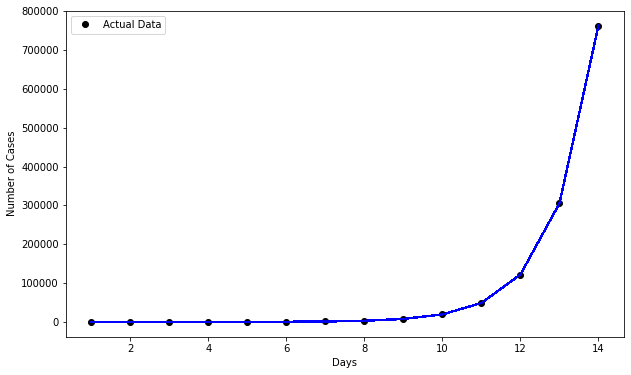

In [84]:
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Model, Parameters

# Define a simple exponential growth model
def exponential_growth(x, A, B):
    return A * np.exp(B * x)

# Generate some synthetic data
x_data = np.arange(1, 15)  # Days
y_data = np.array([5, 12, 30, 80, 200, 500, 1250, 3125, 7813, 19531, 48828, 122070, 305175, 762937])

# Create an lmfit model
model = Model(exponential_growth)

# Set initial parameter values
params = Parameters()
params.add('A', value=1.0, min=0)
params.add('B', value=0.1, min=0)

# Perform the Monte Carlo simulation
num_simulations = 1000
simulated_data = []

for _ in range(num_simulations):
    # Generate synthetic data with random noise
    noise = np.random.normal(scale=100, size=len(x_data))
    synthetic_y = y_data + noise

    result = model.fit(synthetic_y, params, x=x_data)
    simulated_data.append(result.best_fit)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(x_data, y_data, 'ko', label='Actual Data')
for sim_data in simulated_data:
    plt.plot(x_data, sim_data, 'b-', alpha=0.1)
plt.xlabel('Days')
plt.ylabel('Number of Cases')
plt.legend()
plt.show()

In [27]:
# Make Jupyter full screen (not necessary on Colab)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [86]:
#
import plotly.express as px
# import tkinter
# from matplotlib import pyplot as plt
from sklearn.model_selection import cross_val_score
from collections import Counter

import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import gc
# warnings.simplefilter(action='ignore', category="FutureWarning")
# warnings.simplefilter(action='ignore', category="DeprecationWarning")
%matplotlib inline

# sys.path.append(os.path.abspath("/home/laklevi1/anarh/Seminarcode/"))
# from petrology_util_funcs import *

import pandas as pd
import numpy as np
import seaborn as sns
from scipy import stats 
import matplotlib.pyplot as plt
import hvplot.pandas

from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler

from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report, 
    roc_auc_score, roc_curve, auc,
    plot_confusion_matrix, plot_roc_curve
)
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay

from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization 
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import AUC

pd.set_option('display.float', '{:.2f}'.format)
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 50)

from subprocess import check_output
%config Completer.use_jedi = False
%load_ext watermark
%watermark --iversions

The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark
hvplot    : 0.8.4
tensorflow: 2.7.0
scipy     : 1.7.3
numpy     : 1.21.5
emcee     : 3.0.2
pandas    : 1.4.3
matplotlib: 3.5.2
plotly    : 4.14.3
lmfit     : 1.0.2
seaborn   : 0.11.1



In [87]:
SEED = 142

In [88]:
ptdir = "./"
print(check_output(["ls", "{}".format(ptdir)]).decode("utf8"))

BNN.ipynb
DOC-20230729-WA0000.xlsx
Joyce_project.ipynb
OVERALL.xlsx
Sharon_polygon-Copy1.ipynb
archive
baised.pdf
baised.png
catboost_info
file.pkl
galog.log
loanDefault.log
loan_default_Edit_0.ipynb
loan_default_Edit_1.ipynb
loan_default_Edit_2-Copy1.ipynb
loan_default_Edit_2-Copy2.ipynb
loan_default_Edit_2.ipynb
loan_default_Edit_3.ipynb
loan_default_Edit_4.ipynb
loaninfo.tex
newTEST_set.npy
newTRAIN_set.npy
pipeline.html
unbaised.pdf
unbaised.png
veg_missing_data_.png
vegbaised.pdf
vegbaised.png
vis_missing_data_.png
visualizing_missing_data_.png
visualizing_missing_data_with_barplot_Seaborn_distplot.png



In [89]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
# Reset the display options to their default values (optional)
# pd.reset_option('display.max_columns')
# pd.reset_option('display.max_rows')

In [90]:
curDir = '/home/laklevi1/anarh/Loan Defualt PhD Project'

In [91]:
# pd.read_csv??

In [92]:
data_info = pd.read_csv(curDir + '/archive/lending_club_info.csv')
data_info

,LoanStatNew,Description
0,loan_amnt,The listed amount of the loan applied for by t...
1,term,The number of payments on the loan. Values are...
2,int_rate,Interest Rate on the loan
3,installment,The monthly payment owed by the borrower if th...
4,grade,LC assigned loan grade
5,sub_grade,LC assigned loan subgrade
6,emp_title,The job title supplied by the Borrower when ap...
7,emp_length,Employment length in years. Possible values ar...
8,home_ownership,The home ownership status provided by the borr...
9,annual_inc,The self-reported annual income provided by th...


In [93]:
print(data_info)

             LoanStatNew                                        Description
0              loan_amnt  The listed amount of the loan applied for by t...
1                   term  The number of payments on the loan. Values are...
2               int_rate                          Interest Rate on the loan
3            installment  The monthly payment owed by the borrower if th...
4                  grade                             LC assigned loan grade
5              sub_grade                          LC assigned loan subgrade
6              emp_title  The job title supplied by the Borrower when ap...
7             emp_length  Employment length in years. Possible values ar...
8         home_ownership  The home ownership status provided by the borr...
9             annual_inc  The self-reported annual income provided by th...
10   verification_status  Indicates if income was verified by LC, not ve...
11               issue_d                The month which the loan was funded
12          

In [94]:
# Create the helper function 
def feat_info(col_name):
    
    print(data_info.loc[col_name]['Description'])

In [95]:
data_info.columns

Index(['LoanStatNew', 'Description'], dtype='object')

In [96]:
data_info.loc[9]['Description']

'The self-reported annual income provided by the borrower during registration.'

In [104]:
# print(data_info.loc[col_name]['Description'])

In [105]:
# feat_info(col_name='loan_amnt')

In [37]:
# data_info.to_latex("loaninfo.tex")

<ipython-input-37-b55008feb038>:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  data_info.to_latex("loaninfo.tex")


In [32]:
# data_info = pd.read_csv(curDir + '/archive/lending_club_info.csv', index_col='LoanStatNew')
# data_info

,Description
LoanStatNew,
loan_amnt,The listed amount of the loan applied for by t...
term,The number of payments on the loan. Values are...
int_rate,Interest Rate on the loan
installment,The monthly payment owed by the borrower if th...
grade,LC assigned loan grade
sub_grade,LC assigned loan subgrade
emp_title,The job title supplied by the Borrower when ap...
emp_length,Employment length in years. Possible values ar...
home_ownership,The home ownership status provided by the borr...


In [ ]:
data_info.shape

In [99]:
# load the data 
data = pd.read_csv(curDir + '/archive/lending_club_loan_two.csv')
data.head(n=14)

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
0,10000.00,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.00,Not Verified,Jan-2015,Fully Paid,vacation,Vacation,26.24,Jun-1990,16.00,0.00,36369.00,41.80,25.00,w,INDIVIDUAL,0.00,0.00,"0174 Michelle Gateway\r\nMendozaberg, OK 22690"
1,8000.00,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.00,Not Verified,Jan-2015,Fully Paid,debt_consolidation,Debt consolidation,22.05,Jul-2004,17.00,0.00,20131.00,53.30,27.00,f,INDIVIDUAL,3.00,0.00,"1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113"
2,15600.00,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.00,Source Verified,Jan-2015,Fully Paid,credit_card,Credit card refinancing,12.79,Aug-2007,13.00,0.00,11987.00,92.20,26.00,f,INDIVIDUAL,0.00,0.00,"87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113"
3,7200.00,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.00,Not Verified,Nov-2014,Fully Paid,credit_card,Credit card refinancing,2.60,Sep-2006,6.00,0.00,5472.00,21.50,13.00,f,INDIVIDUAL,0.00,0.00,"823 Reid Ford\r\nDelacruzside, MA 00813"
4,24375.00,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.00,Verified,Apr-2013,Charged Off,credit_card,Credit Card Refinance,33.95,Mar-1999,13.00,0.00,24584.00,69.80,43.00,f,INDIVIDUAL,1.00,0.00,"679 Luna Roads\r\nGreggshire, VA 11650"
5,20000.00,36 months,13.33,677.07,C,C3,HR Specialist,10+ years,MORTGAGE,86788.00,Verified,Sep-2015,Fully Paid,debt_consolidation,Debt consolidation,16.31,Jan-2005,8.00,0.00,25757.00,100.60,23.00,f,INDIVIDUAL,4.00,0.00,1726 Cooper Passage Suite 129\r\nNorth Deniseb...
6,18000.00,36 months,5.32,542.07,A,A1,Software Development Engineer,2 years,MORTGAGE,125000.00,Source Verified,Sep-2015,Fully Paid,home_improvement,Home improvement,1.36,Aug-2005,8.00,0.00,4178.00,4.90,25.00,f,INDIVIDUAL,3.00,0.00,"1008 Erika Vista Suite 748\r\nEast Stephanie, ..."
7,13000.00,36 months,11.14,426.47,B,B2,Office Depot,10+ years,RENT,46000.00,Not Verified,Sep-2012,Fully Paid,credit_card,No More Credit Cards,26.87,Sep-1994,11.00,0.00,13425.00,64.50,15.00,f,INDIVIDUAL,0.00,0.00,USCGC Nunez\r\nFPO AE 30723
8,18900.00,60 months,10.99,410.84,B,B3,Application Architect,10+ years,RENT,103000.00,Verified,Oct-2014,Fully Paid,debt_consolidation,Debt consolidation,12.52,Jun-1994,13.00,0.00,18637.00,32.90,40.00,w,INDIVIDUAL,3.00,0.00,USCGC Tran\r\nFPO AP 22690
9,26300.00,36 months,16.29,928.40,C,C5,Regado Biosciences,3 years,MORTGAGE,115000.00,Verified,Apr-2012,Fully Paid,debt_consolidation,Debt Consolidation,23.69,Dec-1997,13.00,0.00,22171.00,82.40,37.00,f,INDIVIDUAL,1.00,0.00,"3390 Luis Rue\r\nMauricestad, VA 00813"


In [106]:
data.shape

(396030, 27)

In [ ]:
data.tail(n=14)

In [ ]:
data['issue_d']

In [ ]:
sorted(pd.to_datetime(data['issue_d'], format='%b-%Y'), reverse=True)

In [ ]:
data.columns

In [107]:
data.drop(['emp_length',
           'address',
           'earliest_cr_line',
          'emp_title',
          'mort_acc',
          'sub_grade',
          'issue_d',
          'initial_list_status',
          'purpose',
          'application_type',
          'verification_status'], axis=1, inplace=True)

data.shape

(396030, 16)

In [108]:
data.head(n=14)

,loan_amnt,term,int_rate,installment,grade,home_ownership,annual_inc,loan_status,title,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies
0,10000.00,36 months,11.44,329.48,B,RENT,117000.00,Fully Paid,Vacation,26.24,16.00,0.00,36369.00,41.80,25.00,0.00
1,8000.00,36 months,11.99,265.68,B,MORTGAGE,65000.00,Fully Paid,Debt consolidation,22.05,17.00,0.00,20131.00,53.30,27.00,0.00
2,15600.00,36 months,10.49,506.97,B,RENT,43057.00,Fully Paid,Credit card refinancing,12.79,13.00,0.00,11987.00,92.20,26.00,0.00
3,7200.00,36 months,6.49,220.65,A,RENT,54000.00,Fully Paid,Credit card refinancing,2.60,6.00,0.00,5472.00,21.50,13.00,0.00
4,24375.00,60 months,17.27,609.33,C,MORTGAGE,55000.00,Charged Off,Credit Card Refinance,33.95,13.00,0.00,24584.00,69.80,43.00,0.00
5,20000.00,36 months,13.33,677.07,C,MORTGAGE,86788.00,Fully Paid,Debt consolidation,16.31,8.00,0.00,25757.00,100.60,23.00,0.00
6,18000.00,36 months,5.32,542.07,A,MORTGAGE,125000.00,Fully Paid,Home improvement,1.36,8.00,0.00,4178.00,4.90,25.00,0.00
7,13000.00,36 months,11.14,426.47,B,RENT,46000.00,Fully Paid,No More Credit Cards,26.87,11.00,0.00,13425.00,64.50,15.00,0.00
8,18900.00,60 months,10.99,410.84,B,RENT,103000.00,Fully Paid,Debt consolidation,12.52,13.00,0.00,18637.00,32.90,40.00,0.00
9,26300.00,36 months,16.29,928.40,C,MORTGAGE,115000.00,Fully Paid,Debt Consolidation,23.69,13.00,0.00,22171.00,82.40,37.00,0.00


In [109]:
def visMissData(df_):
    plt.figure(figsize=(10,6))
    sns.displot(
                data=df_.isna().melt(value_name="missing"),
                y="variable",
                hue="missing",
                multiple="fill",
                aspect=1.25
    )
    plt.savefig("vis_missing_data_.png", dpi=200)

<Figure size 720x432 with 0 Axes>

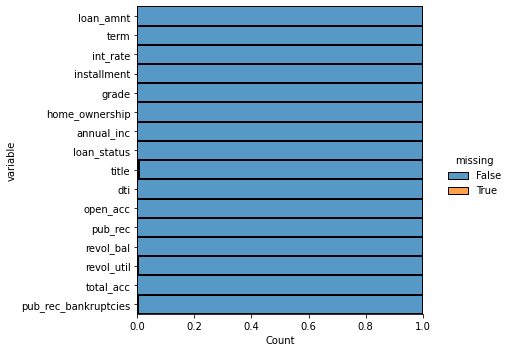

In [110]:
visMissData(df_ = data)

<Figure size 720x432 with 0 Axes>

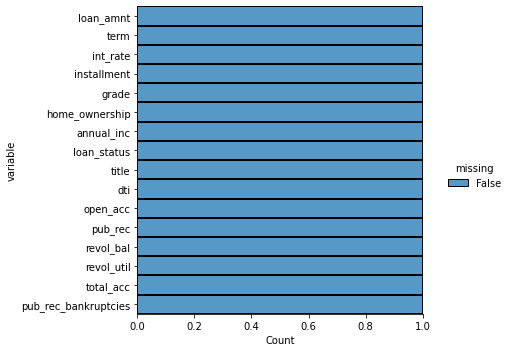

In [111]:
data.dropna( inplace=True)
visMissData(df_ = data)

In [112]:
data.shape

(393465, 16)

In [113]:
cat_features = data.select_dtypes(exclude=[np.number])
cat_features.head()

,term,grade,home_ownership,loan_status,title
0,36 months,B,RENT,Fully Paid,Vacation
1,36 months,B,MORTGAGE,Fully Paid,Debt consolidation
2,36 months,B,RENT,Fully Paid,Credit card refinancing
3,36 months,A,RENT,Fully Paid,Credit card refinancing
4,60 months,C,MORTGAGE,Charged Off,Credit Card Refinance


In [114]:
num_features = data.select_dtypes(include=[np.number])
num_features.head()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies
0,10000.00,11.44,329.48,117000.00,26.24,16.00,0.00,36369.00,41.80,25.00,0.00
1,8000.00,11.99,265.68,65000.00,22.05,17.00,0.00,20131.00,53.30,27.00,0.00
2,15600.00,10.49,506.97,43057.00,12.79,13.00,0.00,11987.00,92.20,26.00,0.00
3,7200.00,6.49,220.65,54000.00,2.60,6.00,0.00,5472.00,21.50,13.00,0.00
4,24375.00,17.27,609.33,55000.00,33.95,13.00,0.00,24584.00,69.80,43.00,0.00


In [116]:
# num_features

In [117]:
dfL = num_features.copy()
cat_maps = {'loanStatus': {'Fully Paid': 0, 'Charged Off': 1} }
dfL['loanStatus'] = data['loan_status']

dfL['loanStatus'] = dfL['loanStatus'].map(cat_maps['loanStatus'])
dfL.dropna( inplace=True)
dfL.head()

In [ ]:
dfL.shape

In [ ]:
dfL["loanStatus"].value_counts()

## B4 scaling

Time taken to create Subset 1 pairplot: 1399.0619032382965 seconds


<Figure size 7500x7500 with 0 Axes>

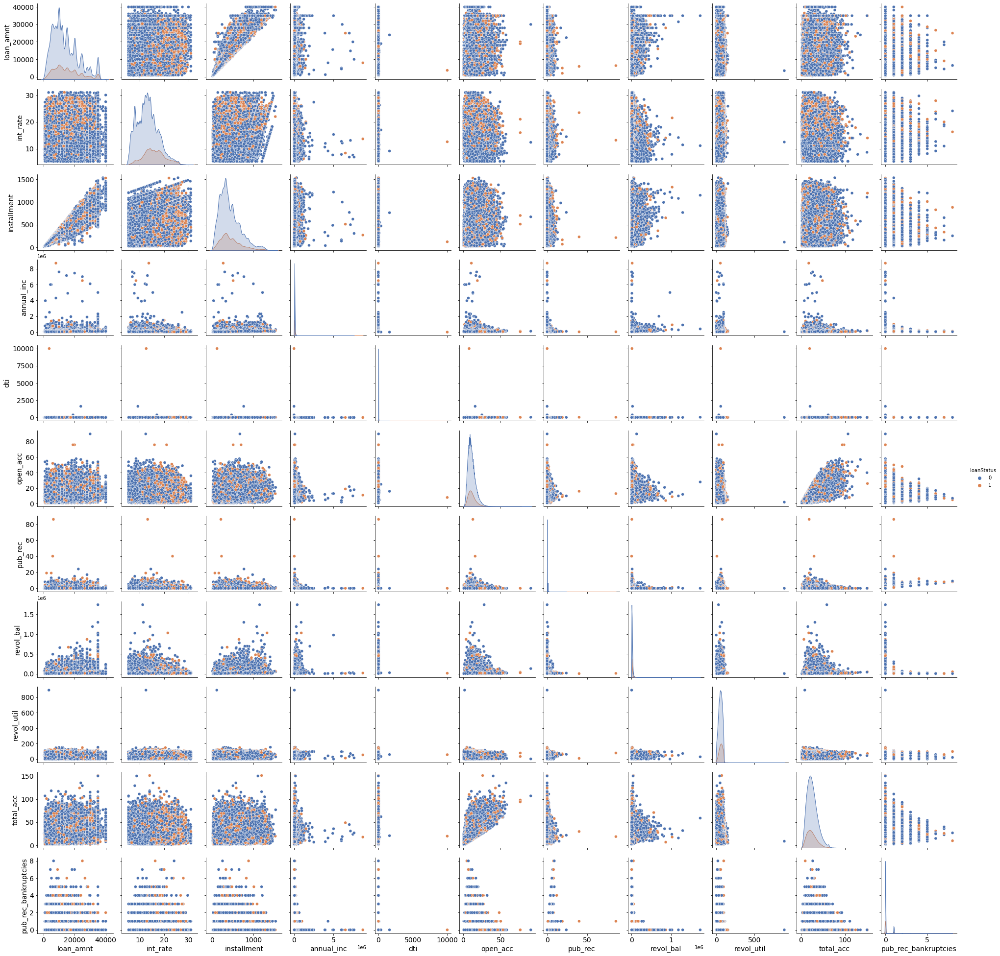

In [143]:
import time

plt.figure(figsize=(25,25), dpi=300)

# Measure the time to create each pairplot
start_time = time.time()

pairplot = sns.pairplot(data=dfL,
             hue='loanStatus',
             diag_kind='kde',
             palette='deep')

# Set x and y label font sizes individually
for ax in pairplot.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), fontsize=14)
    ax.set_ylabel(ax.get_ylabel(), fontsize=14)
    
# Adjust x and y tick label sizes for all subplots
for ax in pairplot.axes.flat:
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)
    
elapsed_time = time.time() - start_time
print(f"Time taken to create LClub pairplot: {elapsed_time} seconds")

# Increase DPI for higher resolution (adjust the DPI value as needed)
plt.savefig('pairplot_high_res_.png', dpi=300)
plt.savefig('pairplot_high_res_.pdf', dpi=300)

In [ ]:
# plt.figure(figsize=(15,15))

# pairplot = sns.pairplot(data=dfL,
#              hue='loanStatus',
#              diag_kind='kde',
#              palette='deep')

# # Set x and y label font sizes individually
# for ax in pairplot.axes.flatten():
#     ax.set_xlabel(ax.get_xlabel(), fontsize=14)
#     ax.set_ylabel(ax.get_ylabel(), fontsize=14)

In [139]:
dfL.shape

(393465, 12)

In [144]:
# plt.figure(figsize=(15,15), dpi=300)

# # Pairplot with Parallel Processing
# pairplot = sns.pairplot(data=dfL,
#                          hue='loanStatus',
#                          diag_kind='kde',
#                          palette='deep',
#                          )

# # Increase the font size of x and y labels
# # pairplot = sns.pairplot(data)
# pairplot.fig.suptitle('Pairplot of Numeric Attributes in Lending Club Loan Dataset', y=1.02, fontsize=14)  # Title at an increased distance
# # pairplot.set_axis_labels(fontsize=14)  # Increase axis labels font size


# # Increase label and ticks font sizes
# plt.xticks(fontsize=24)  # Change the x-axis tick font size
# plt.yticks(fontsize=14)  # Change the y-axis tick font size

# # Set x and y label font sizes individually
# for ax in pairplot.axes.flatten():
#     ax.set_xlabel(ax.get_xlabel(), fontsize=14)
#     ax.set_ylabel(ax.get_ylabel(), fontsize=14)

In [145]:
# dt = sns.load_dataset("iris")
# pairplot = sns.pairplot(dt)
# # pairplot.set_axis_labels(fontsize=10)  # Increase axis labels font size
# plt.suptitle('title', y=1.02, fontsize=15)  # Title at an increased distance
# # plt.xticks(fontsize=24)  # Change the x-axis tick font size
# # plt.yticks(fontsize=14)  # Change the y-axis tick font size

# # Set x and y label font sizes individually
# for ax in pairplot.axes.flatten():
#     ax.set_xlabel(ax.get_xlabel(), fontsize=14)
#     ax.set_ylabel(ax.get_ylabel(), fontsize=14)
    
# # Adjust x and y tick label sizes for all subplots
# for ax in pairplot.axes.flat:
#     ax.tick_params(axis='x', labelsize=14)
#     ax.tick_params(axis='y', labelsize=11)

In [146]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import multiprocessing

# # Example dataframe (replace this with your dataset)
# data = sns.load_dataset("iris")

# # Function to create a pairplot for a subset of columns
# def create_pairplot(data, columns, title):
#     pairplot = sns.pairplot(data[columns])
#     pairplot.set_axis_labels(fontsize=10)  # Increase axis labels font size
#     pairplot.fig.suptitle(title, y=1.02)  # Title at an increased distance
#     return pairplot

# # Define the subsets of columns
# subset1 = ['sepal_length', 'sepal_width']
# subset2 = ['petal_length', 'petal_width']

# # Create a multiprocessing pool
# pool = multiprocessing.Pool(processes=2)  # You can adjust the number of processes

# # Create pairplots for subsets in parallel
# pairplot1 = pool.apply_async(create_pairplot, (data, subset1, 'Subset 1'))
# pairplot2 = pool.apply_async(create_pairplot, (data, subset2, 'Subset 2'))

# # Get the results
# pairplot1 = pairplot1.get()
# pairplot2 = pairplot2.get()

# # Close the pool
# pool.close()
# pool.join()

# # Display the pairplots
# plt.show()

In [147]:
# Dc = num_features.copy()
# Logtrns = np.log1p(Dc.values)

# Dcc = pd.DataFrame(Logtrns, columns=list(Dc.columns))
# Dcc['loanStatus'] = data['loan_status']
# plt.figure(figsize=(15,15))

# sns.pairplot(data=Dcc,
#              hue='loanStatus',
#              diag_kind='kde',
#              palette='deep')

## Quantile Normalisation

In [148]:
from sklearn.preprocessing import QuantileTransformer as qt

In [156]:
# qt?

In [150]:
# quantile transform the raw data
quantile = qt(output_distribution='normal')
data_trans = quantile.fit_transform(dfL.iloc[:, dfL.columns != 'loanStatus'])

In [151]:
data_trans.shape

(393465, 11)

In [152]:
dfL.columns[dfL.columns != 'loanStatus']

Index(['loan_amnt', 'int_rate', 'installment', 'annual_inc', 'dti', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'pub_rec_bankruptcies'],
      dtype='object')

In [153]:
data_transd = pd.DataFrame(data_trans, columns=list(dfL.columns[dfL.columns != 'loanStatus']))

In [154]:
data_transd.head()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies
0,-0.31,-0.48,-0.24,1.19,1.04,1.00,-5.20,1.48,-0.46,0.10,-5.20
1,-0.63,-0.36,-0.59,0.04,0.58,1.14,-5.20,0.71,-0.05,0.27,-5.20
2,0.36,-0.68,0.48,-0.77,-0.49,0.50,-5.20,0.08,1.66,0.19,-5.20
3,-0.75,-1.82,-0.83,-0.34,-2.06,-1.16,-5.20,-0.77,-1.22,-1.10,-5.20
4,1.12,0.80,0.79,-0.29,1.98,0.50,-5.20,0.96,0.56,1.37,-5.20


In [155]:
data_transd['loanStatus'] = dfL['loanStatus']

### After Normalisation

Time taken to create LClub pairplot: 1403.0025203227997 seconds


<Figure size 7500x7500 with 0 Axes>

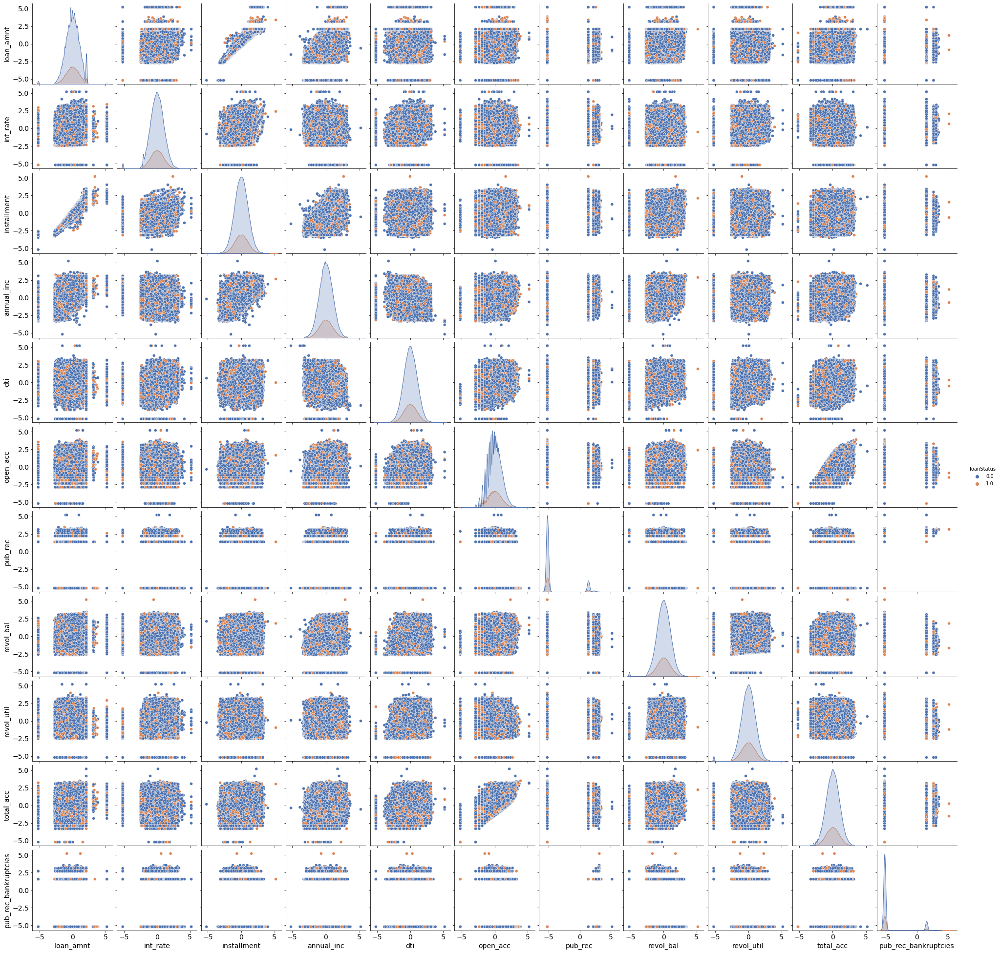

In [157]:
#https://seaborn.pydata.org/generated/seaborn.pairplot.html
# sns.pairplot(data=data_transd,
#              hue='loanStatus',
#              diag_kind='kde',
#              palette='deep')

import time

plt.figure(figsize=(25,25), dpi=300)

# Measure the time to create each pairplot
start_time = time.time()

pairplot = sns.pairplot(data=data_transd,
             hue='loanStatus',
             diag_kind='kde',
             palette='deep')

# Set x and y label font sizes individually
for ax in pairplot.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), fontsize=14)
    ax.set_ylabel(ax.get_ylabel(), fontsize=14)
    
# Adjust x and y tick label sizes for all subplots
for ax in pairplot.axes.flat:
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)
    
elapsed_time = time.time() - start_time
print(f"Time taken to create LClub pairplot: {elapsed_time} seconds")

# Increase DPI for higher resolution (adjust the DPI value as needed)
plt.savefig('pairplot_high_res_quantile.png', dpi=300)
plt.savefig('pairplot_high_res_quantile.pdf', dpi=300)

In [158]:
data_transd.columns

Index(['loan_amnt', 'int_rate', 'installment', 'annual_inc', 'dti', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'pub_rec_bankruptcies', 'loanStatus'],
      dtype='object')

In [159]:
data_transd.drop(['pub_rec_bankruptcies', 'pub_rec' ], axis=1, inplace=True)

In [161]:
data_transd['loanStatus'].values.astype(int)

array([0, 0, 0, ..., 0, 0, 1])

In [162]:
data_transd.dropna(inplace=True)
data_transd['loanStatus'] = data_transd['loanStatus'].values.astype(int)
data_transd.head()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,revol_bal,revol_util,total_acc,loanStatus
0,-0.31,-0.48,-0.24,1.19,1.04,1.00,1.48,-0.46,0.10,0
1,-0.63,-0.36,-0.59,0.04,0.58,1.14,0.71,-0.05,0.27,0
2,0.36,-0.68,0.48,-0.77,-0.49,0.50,0.08,1.66,0.19,0
3,-0.75,-1.82,-0.83,-0.34,-2.06,-1.16,-0.77,-1.22,-1.10,0
4,1.12,0.80,0.79,-0.29,1.98,0.50,0.96,0.56,1.37,1


Time taken to create LClub pairplot: 934.2666735649109 seconds


<Figure size 7500x7500 with 0 Axes>

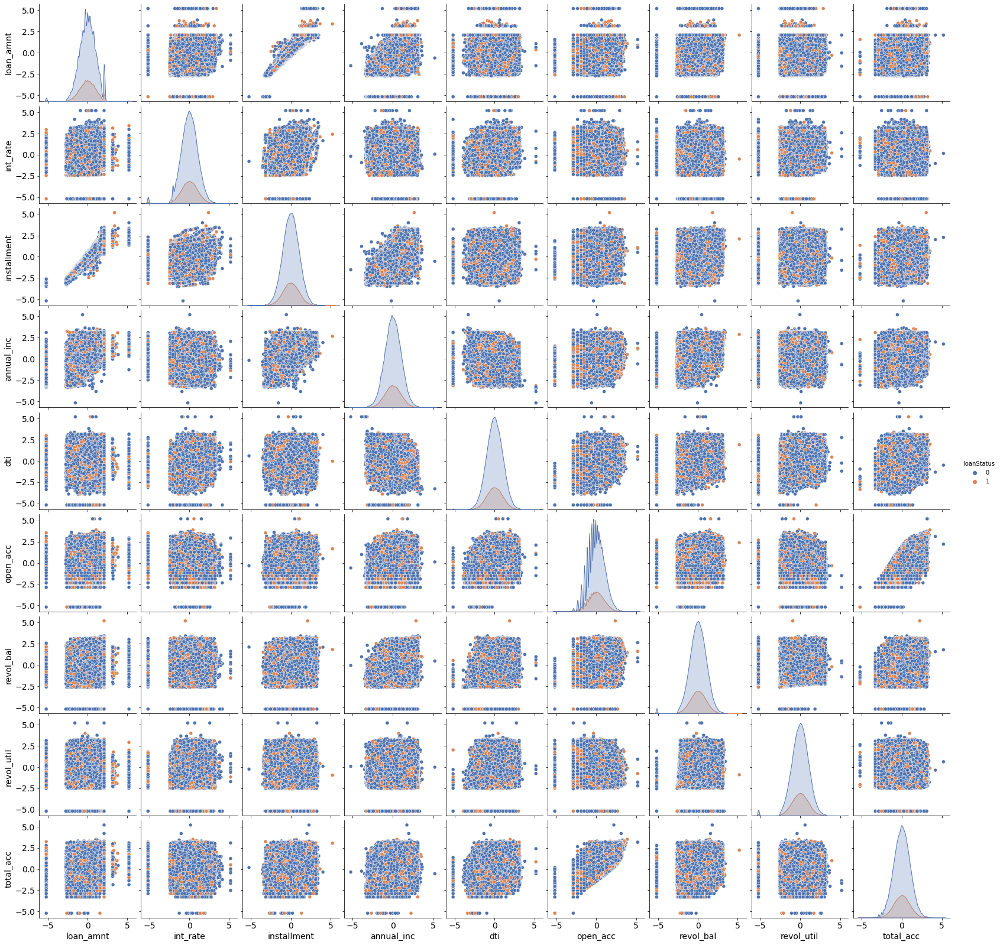

In [165]:
#https://seaborn.pydata.org/generated/seaborn.pairplot.html
# sns.pairplot(data=data_transd,
#              hue='loanStatus',
#              diag_kind='kde',
#              palette='deep')

import time

plt.figure(figsize=(25,25), dpi=300)

# Measure the time to create each pairplot
start_time = time.time()

pairplot = sns.pairplot(data=data_transd,
             hue='loanStatus',
             diag_kind='kde',
             palette='deep')

# Set x and y label font sizes individually
for ax in pairplot.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), fontsize=14)
    ax.set_ylabel(ax.get_ylabel(), fontsize=14)
    
# Adjust x and y tick label sizes for all subplots
for ax in pairplot.axes.flat:
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)
    
elapsed_time = time.time() - start_time
print(f"Time taken to create LClub pairplot: {elapsed_time} seconds")

# Increase DPI for higher resolution (adjust the DPI value as needed)
plt.savefig('pairplot_high_res_quantile.png', dpi=300)
plt.savefig('pairplot_high_res_quantile.pdf', dpi=300)

### Checking for baisedness in the model

In [ ]:
#
import matplotlib._color_data as mcd
import random

"""Remember to run the Latex code !!!"""
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
#         return r'${p:.1f}\%$'.format(p=pct) + '\n' + r'$({v:d})$'.format(v=val)
        return r'${p:.1f}\%$' '\n' r'$({v:d})$'.format(p=pct, v=val)
    return my_autopct
#

In [ ]:
data_transd["loanStatus"].value_counts()

['steelblue', 'mediumpurple']


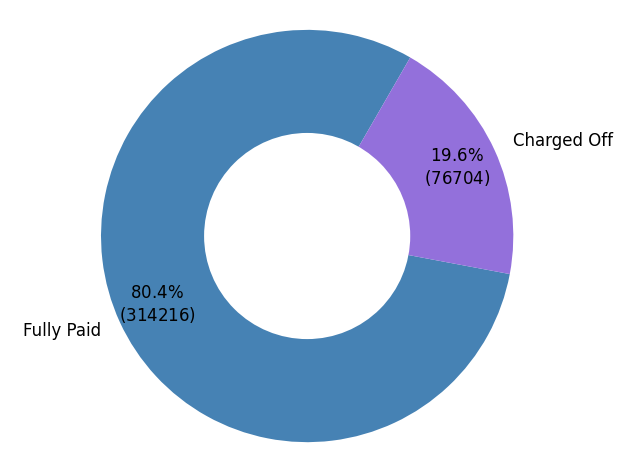

In [34]:
# labels = list(np.unique(df_merged["loan_status"]))
labels = ['Fully Paid', 'Charged Off'] 
sizes = [data_transd["loanStatus"].value_counts()[0], data_transd["loanStatus"].value_counts()[1]] 
#colors ['steelblue', 'mediumpurple']
# colors = ['#f19911',
#           '#99ff99',]
# #           '#99ff99',#66b3ff
# #           '#ffcc99',
# #           '#f19911', 
# #           '#fcee00',#ff9c99
# #           '#b26b6b']

topN = len(labels)
colors = ['steelblue', 'mediumpurple']
# colors = random.sample(population=list(mcd.CSS4_COLORS.keys()), k=topN)
fig1, ax1 = plt.subplots(figsize=(8,6), dpi=80)


patches, texts, autotexts = ax1.pie(sizes,
                                    labels=labels,
                                    autopct=make_autopct(values=sizes),
                                    startangle=60, 
                                    pctdistance=0.80, 
                                    colors = colors,
                                    textprops={'fontsize': 15}) 
# shadow=True,
for k in range(len(labels)):
        texts[k].set_fontsize(15)
        
#draw circle
centre_circle = plt.Circle((0,0),0.50,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.savefig('unbaised.pdf', dpi = 200)
plt.savefig('unbaised.png', dpi = 200)
print(colors)
# https://pandas.pydata.org/docs/user_guide/merging.html

In [ ]:
# colors

In [38]:
cat_features.columns

Index(['term', 'grade', 'home_ownership', 'loan_status', 'title'], dtype='object')

In [39]:
# list(cat_features['title'])

In [40]:
cat_features.drop(['title', 'loan_status' ], axis=1, inplace=True)

In [41]:
# Assigning categorical variables to a numerical value
cat_maps = {'term': {' 36 months': 0,
                     ' 60 months': 1},
           'grade': {'A': 0, 
                     'B': 1,
                     'C': 2,
                     'D': 3, 
                     'E': 4, 
                     'F': 5,
                     'G': 6},
#            'emp_length': {'< 1 year': 0,
#                           '1 year': 1, 
#                           '2 years': 2, 
#                           '3 years': 3,
#                           '4 years': 4, 
#                           '5 years': 5, 
#                           '6 years': 6, 
#                           '7 years': 7,
#                           '8 years': 8, 
#                           '9 years': 9, 
#                           '10+ years': 10},
            'home_ownership': {'RENT': 0, 
                               'MORTGAGE': 1,
                               'OWN': 2,
                               'OTHER': 3,
                               'NONE': 4,
                               'ANY': 5},
#             'loan_status': {'Fully Paid': 0,
#                             ' Charged Off': 1}
            
           }
dfm = data_transd.copy()
dfm['term'] = cat_features['term'].map(cat_maps['term'])
dfm['grade'] = cat_features['grade'].map(cat_maps['grade'])
dfm['home_ownership'] = cat_features['home_ownership'].map(cat_maps['home_ownership'])
# data['loan_status'] = data['loan_status'].map(cat_maps['loan_status'])
# data['emp_length'] = data['emp_length'].map(cat_maps['emp_length'])
dfm.head()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,revol_bal,revol_util,total_acc,loanStatus,term,grade,home_ownership
0,-0.31,-0.48,-0.24,1.19,1.03,0.98,1.48,-0.46,0.10,0.00,0,1,0
1,-0.63,-0.36,-0.60,0.04,0.57,1.13,0.71,-0.06,0.27,0.00,0,1,1
2,0.36,-0.68,0.49,-0.78,-0.48,0.50,0.08,1.65,0.19,0.00,0,1,0
3,-0.75,-1.83,-0.84,-0.34,-2.06,-1.17,-0.77,-1.22,-1.09,0.00,0,0,0
4,1.12,0.81,0.79,-0.29,1.98,0.50,0.96,0.55,1.39,1.00,1,2,1


In [42]:
Xe = dfm.iloc[:, dfm.columns != 'loanStatus']
ye = dfm['loanStatus']

In [ ]:
# Xe

In [ ]:
# ClusterCentroids?

In [ ]:
"""
Synthetic Minority Oversampling Technique (SMOTE) for handling class imbalance.
Only numerical features should be inputted with categorical features untouched

"""
# try:
#     from imblearn.over_sampling import SMOTENC
# except:
#     from imblearn.over_sampling import SMOTENC

# smote = SMOTENC(random_state=SEED, categorical_features=[9, 10, 11], sampling_strategy='auto') # we pass the index of the input numerical features
# Xs , ys = smote.fit_resample(Xe, ye)

try:
    from imblearn.under_sampling import ClusterCentroids
except:
    from imblearn.under_sampling import ClusterCentroids
    
cc = ClusterCentroids(random_state=SEED)
X_resampled, y_resampled = cc.fit_resample(Xe, ye)

In [148]:
ClusterCentroids?

In [50]:
X_resampled.shape# Xs.shape

(153408, 12)

In [51]:
X_resampled.head()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,revol_bal,revol_util,total_acc,term,grade,home_ownership
0,-0.75,-2.11,-0.87,-0.12,-0.19,-1.34,-0.03,-0.08,-1.43,0,1,1
1,1.24,2.05,1.23,0.79,0.25,0.74,1.11,0.45,0.52,0,0,0
2,0.24,-0.36,0.39,-0.61,-1.34,-0.98,-0.35,0.22,-1.47,0,2,0
3,-0.48,-0.57,-0.44,-0.69,-0.18,-0.59,-0.95,-0.88,-0.11,0,0,1
4,0.20,-0.71,0.31,0.13,0.45,0.08,0.54,0.17,0.03,0,0,1


In [63]:
from collections import Counter
# summarize the new class distribution
counter = Counter(y_resampled)
print(counter)

Counter({0.0: 76704, 1.0: 76704})


In [57]:
num_features

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies
0,10000.00,11.44,329.48,117000.00,26.24,16.00,0.00,36369.00,41.80,25.00,0.00
1,8000.00,11.99,265.68,65000.00,22.05,17.00,0.00,20131.00,53.30,27.00,0.00
2,15600.00,10.49,506.97,43057.00,12.79,13.00,0.00,11987.00,92.20,26.00,0.00
3,7200.00,6.49,220.65,54000.00,2.60,6.00,0.00,5472.00,21.50,13.00,0.00
4,24375.00,17.27,609.33,55000.00,33.95,13.00,0.00,24584.00,69.80,43.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...
396025,10000.00,10.99,217.38,40000.00,15.63,6.00,0.00,1990.00,34.30,23.00,0.00
396026,21000.00,12.29,700.42,110000.00,21.45,6.00,0.00,43263.00,95.70,8.00,0.00
396027,5000.00,9.99,161.32,56500.00,17.56,15.00,0.00,32704.00,66.90,23.00,0.00
396028,21000.00,15.31,503.02,64000.00,15.88,9.00,0.00,15704.00,53.80,20.00,0.00


In [58]:
# cols = X_resampled.columns
# num_cols = df_._get_numeric_data().columns
# list(set(cols) - set(cat_features.columns))

['revol_bal',
 'int_rate',
 'total_acc',
 'revol_util',
 'installment',
 'dti',
 'loan_amnt',
 'open_acc',
 'annual_inc']

In [61]:
 X_resampled.shape, y_resampled.shape

((153408, 12), (153408,))

In [65]:
y_resampled.values.astype(int)

array([0, 0, 0, ..., 1, 1, 1])

In [66]:
cols = X_resampled.columns
df_udsampl = X_resampled[list(set(cols) - set(cat_features.columns))]
df_udsampl['loanStatus']= y_resampled.values.astype(int)

<ipython-input-66-69de2629725d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_udsampl['loanStatus']= y_resampled.values.astype(int)


In [67]:
df_udsampl

,revol_bal,int_rate,total_acc,revol_util,installment,dti,loan_amnt,open_acc,annual_inc,loanStatus
0,-0.03,-2.11,-1.43,-0.08,-0.87,-0.19,-0.75,-1.34,-0.12,0
1,1.11,2.05,0.52,0.45,1.23,0.25,1.24,0.74,0.79,0
2,-0.35,-0.36,-1.47,0.22,0.39,-1.34,0.24,-0.98,-0.61,0
3,-0.95,-0.57,-0.11,-0.88,-0.44,-0.18,-0.48,-0.59,-0.69,0
4,0.54,-0.71,0.03,0.17,0.31,0.45,0.20,0.08,0.13,0
...,...,...,...,...,...,...,...,...,...,...
153403,1.23,-0.17,0.87,0.05,1.30,0.17,2.07,0.98,1.03,1
153404,-1.28,-0.98,-1.51,-1.19,-0.31,-0.41,-0.31,-0.87,-1.06,1
153405,0.84,-0.84,-0.25,1.63,0.38,-0.68,0.28,-0.11,1.20,1
153406,-1.07,-2.46,1.79,-1.84,-1.80,0.51,-1.67,1.27,-1.34,1


### Afer Undersampling

['steelblue', 'mediumpurple']


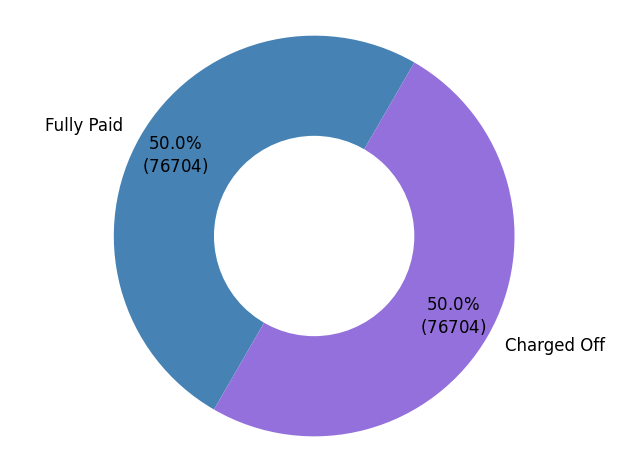

In [147]:
labels = ['Fully Paid', 'Charged Off'] 
sizes = [df_udsampl['loanStatus'].value_counts()[0], df_udsampl['loanStatus'].value_counts()[1]] 
#colors ['steelblue', 'mediumpurple']
# colors = ['#f19911',
#           '#99ff99',]
# #           '#99ff99',#66b3ff
# #           '#ffcc99',
# #           '#f19911', 
# #           '#fcee00',#ff9c99
# #           '#b26b6b']

topN = len(labels)
colors = ['steelblue', 'mediumpurple']
# colors = random.sample(population=list(mcd.CSS4_COLORS.keys()), k=topN)
fig1, ax1 = plt.subplots(figsize=(8,6), dpi=80)


patches, texts, autotexts = ax1.pie(sizes,
                                    labels=labels,
                                    autopct=make_autopct(values=sizes),
                                    startangle=60, 
                                    pctdistance=0.80, 
                                    colors = colors,
                                    textprops={'fontsize': 15}) 
# shadow=True,
for k in range(len(labels)):
        texts[k].set_fontsize(15)
        
#draw circle
centre_circle = plt.Circle((0,0),0.50,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.savefig('unbaised.pdf', dpi = 200)
plt.savefig('unbaised.png', dpi = 200)
print(colors)

<Figure size 1080x1080 with 0 Axes>

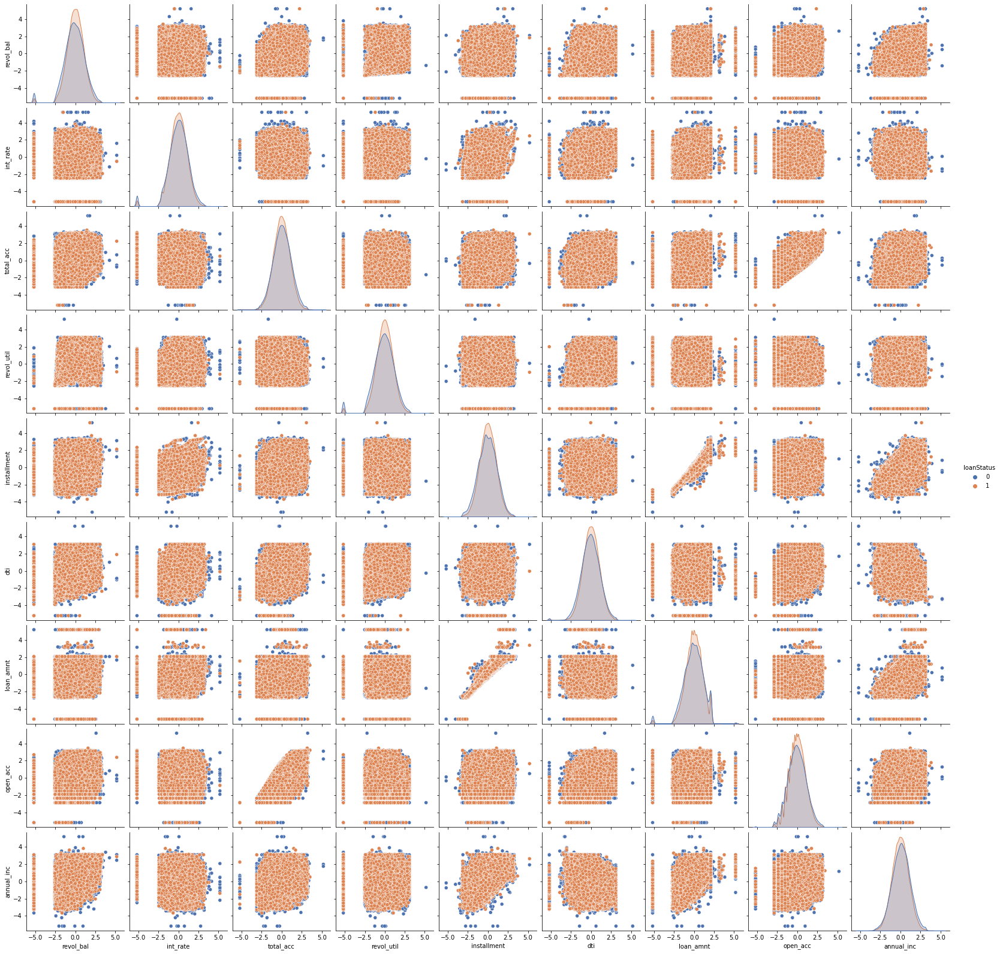

In [68]:
plt.figure(figsize=(15,15))

sns.pairplot(data=df_udsampl,
             hue='loanStatus',
             diag_kind='kde',
             palette='deep')
#https://seaborn.pydata.org/generated/seaborn.pairplot.html

* save undersample dataFrame as pickle

In [344]:
df_udsampl.head()

,revol_bal,int_rate,total_acc,revol_util,installment,dti,loan_amnt,open_acc,annual_inc,loanStatus
0,-0.03,-2.11,-1.43,-0.08,-0.87,-0.19,-0.75,-1.34,-0.12,0
1,1.11,2.05,0.52,0.45,1.23,0.25,1.24,0.74,0.79,0
2,-0.35,-0.36,-1.47,0.22,0.39,-1.34,0.24,-0.98,-0.61,0
3,-0.95,-0.57,-0.11,-0.88,-0.44,-0.18,-0.48,-0.59,-0.69,0
4,0.54,-0.71,0.03,0.17,0.31,0.45,0.20,0.08,0.13,0


In [345]:
import pickle

# def pckleFile(fname)
# Open a file and use dump()

with open('file.pkl', 'wb') as file:
      
    # A new file will be created
    pickle.dump(df_udsampl, file)

In [155]:
df_udsampl.columns

Index(['revol_bal', 'int_rate', 'total_acc', 'revol_util', 'installment',
       'dti', 'loan_amnt', 'open_acc', 'annual_inc', 'loanStatus'],
      dtype='object')

In [156]:
df_udsampl.query("loanStatus==0")

,revol_bal,int_rate,total_acc,revol_util,installment,dti,loan_amnt,open_acc,annual_inc,loanStatus
0,-0.03,-2.11,-1.43,-0.08,-0.87,-0.19,-0.75,-1.34,-0.12,0
1,1.11,2.05,0.52,0.45,1.23,0.25,1.24,0.74,0.79,0
2,-0.35,-0.36,-1.47,0.22,0.39,-1.34,0.24,-0.98,-0.61,0
3,-0.95,-0.57,-0.11,-0.88,-0.44,-0.18,-0.48,-0.59,-0.69,0
4,0.54,-0.71,0.03,0.17,0.31,0.45,0.20,0.08,0.13,0
...,...,...,...,...,...,...,...,...,...,...
76699,-1.52,1.82,-1.19,-0.21,0.18,1.11,-0.02,-0.11,-0.13,0
76700,-1.03,1.03,-1.55,0.48,-0.85,-1.03,-0.96,-1.10,-2.21,0
76701,-0.35,1.06,-0.25,0.44,-1.08,1.63,-1.22,-1.21,-2.67,0
76702,-2.38,-1.52,0.13,-2.31,-2.37,-1.07,-2.28,-0.22,-1.29,0


In [170]:
dfs = df_udsampl.query("loanStatus==0")

In [183]:
import seaborn as sns
sns.set_context('poster')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 
             's' : 180, 'linewidths':0}

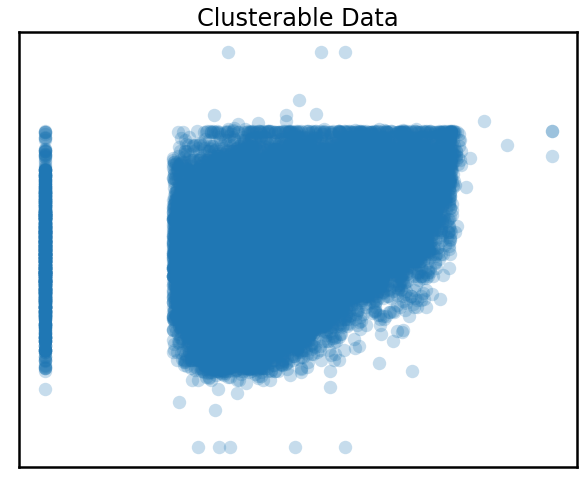

In [184]:
fig = plt.figure(1, figsize=(10, 8))
plt.clf()
plt.title("Clusterable Data")
plt.scatter(df_udsampl.query("loanStatus==0")['revol_bal'], 
            df_udsampl.query("loanStatus==0")['annual_inc'],
#            alpha=0.5,
#            s=150,
           **plot_kwds)
frame = plt.gca()
frame.axes.get_xaxis().set_visible(False)
frame.axes.get_yaxis().set_visible(False)

In [163]:
#!pip install hdbscan

     |████████████████████████████████| 5.2 MB 477 kB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.33-cp38-cp38-linux_x86_64.whl size=3780406 sha256=b4701667fce35fe57b345709515673f679d7be2e722f8f8c57edca25dcba19b4
  Stored in directory: /home/laklevi1/.cache/pip/wheels/72/93/36/3c7c74a6f2127e71810a0e0f535955175556a434aec55de679
Successfully built hdbscan


In [164]:
import sklearn.cluster as cluster
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
import hdbscan

In [175]:
# to cluster we need to generate a clustering object.

clusterer = hdbscan.HDBSCAN(metric='manhattan')

# We can then use this clustering object and fit it to the data we have.
#This will return the clusterer object back to you 

clusterer.fit(dfs.iloc[:, dfs.columns != 'loanStatus'])

HDBSCAN(metric='manhattan')

The clusterer object stores the result in an attribute labels_.

It is an array with an integer for each data sample. Samples that are in the same cluster get assigned the same number. The cluster labels start at 0 and count up. We can thus determine the number of clusters found by finding the largest cluster label.

In [176]:
clusterer.labels_, clusterer.labels_.min(), clusterer.labels_.max()

(array([8, 8, 8, ..., 8, 8, 8]), -1, 8)

In [208]:
clusterer.outlier_scores_

array([0.08459703, 0.01164339, 0.00713731, ..., 0.10114201, 0.00247352,
       0.01073443])

* So we have a total of three clusters, with labels 0, 1, and 2.

* Importantly HDBSCAN is noise aware -- it has a notion of data samples that are not assigned to any cluster.

* This is handled by assigning these samples the label -1. 

* The hdbscan library implements soft clustering, where each data point is assigned a cluster membership score ranging from 0.0 to 1.0. 

* A score of 0.0 represents a sample that is not in the cluster at all (all noise points will get this score) while a score of 1.0 represents a sample that is at the heart of the cluster (note that this is not the spatial centroid notion of core). 

* You can access these scores via the probabilities_ attribute.

In [177]:
clusterer.probabilities_

array([1., 1., 1., ..., 1., 1., 1.])

* Different metri.cs are available, via sklearn

In [179]:
hdbscan.dist_metrics.METRIC_MAPPING

{'euclidean': hdbscan.dist_metrics.EuclideanDistance,
 'l2': hdbscan.dist_metrics.EuclideanDistance,
 'minkowski': hdbscan.dist_metrics.MinkowskiDistance,
 'p': hdbscan.dist_metrics.MinkowskiDistance,
 'manhattan': hdbscan.dist_metrics.ManhattanDistance,
 'cityblock': hdbscan.dist_metrics.ManhattanDistance,
 'l1': hdbscan.dist_metrics.ManhattanDistance,
 'chebyshev': hdbscan.dist_metrics.ChebyshevDistance,
 'infinity': hdbscan.dist_metrics.ChebyshevDistance,
 'seuclidean': hdbscan.dist_metrics.SEuclideanDistance,
 'mahalanobis': hdbscan.dist_metrics.MahalanobisDistance,
 'wminkowski': hdbscan.dist_metrics.WMinkowskiDistance,
 'hamming': hdbscan.dist_metrics.HammingDistance,
 'canberra': hdbscan.dist_metrics.CanberraDistance,
 'braycurtis': hdbscan.dist_metrics.BrayCurtisDistance,
 'matching': hdbscan.dist_metrics.MatchingDistance,
 'jaccard': hdbscan.dist_metrics.JaccardDistance,
 'dice': hdbscan.dist_metrics.DiceDistance,
 'kulsinski': hdbscan.dist_metrics.KulsinskiDistance,
 'rogerst

In [253]:
def plot_clusters(data, algorithm, args, kwds):
    start_time = time.time()
    labels = algorithm(*args, **kwds).fit_predict(data)
    end_time = time.time()
    palette = sns.color_palette('deep', np.unique(labels).max() + 1)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
    fig = plt.figure(1, figsize=(10, 8))
    plt.clf()
#     sc = plt.scatter(data.T[0], data.T[1], c=colors, **plot_kwds)
#     print(*sc.legend_elements())
#     plt.legend(handles=sc.legend_elements()[0], 
#            labels=np.unique(labels),
#            title="species")
#     plt.legend(labels=np.unique(labels), title="species")
    for c in np.unique(labels):
        plt.scatter(data.T[labels==c,0], data.T[labels==c,1], label=c, c=colors, **plot_kwds)
#     plt.legend(*sc.legend_elements(),
#                     loc="lower left", title="Classes")
    plt.legend()
    frame = plt.gca()
    frame.axes.get_xaxis().set_visible(False)
    frame.axes.get_yaxis().set_visible(False)
    plt.title('Clusters found by {}'.format(str(algorithm.__name__)), fontsize=16)
    plt.text(-0.5, 0.6, 'Clustering took {:.2f} s'.format(end_time - start_time), fontsize=10)
    return labels #, sc, colors

In [342]:
def plot_clusters1(data, algorithm, args, kwds):
    start_time = time.time()
    labels = algorithm(*args, **kwds).fit_predict(data)
    end_time = time.time()
    palette = sns.color_palette('deep', np.unique(labels).max() + 1)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
    fig = plt.figure(1, figsize=(10, 8))
    plt.clf()
    for c in np.unique(labels):
        plt.scatter(data[labels==c,0], data[labels==c,1], label=c)

    plt.legend()
    frame = plt.gca()
    frame.axes.get_xaxis().set_visible(False)
    frame.axes.get_yaxis().set_visible(False)
    plt.title('Clusters found by {}'.format(str(algorithm.__name__)), fontsize=16)
    plt.text(-0.5, 0.6, 'Clustering took {:.2f} s'.format(end_time - start_time), fontsize=10)
    
    return labels #, sc, colors

def plot_clusters2(data, algorithm, args, kwds, xlb, ylb):
    start_time = time.time()
    labels = algorithm(*args, **kwds).fit_predict(data)
    end_time = time.time()
    palette = sns.color_palette('deep', np.unique(labels).max() + 1)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
#     fig = plt.figure(1, figsize=(10, 8))
#     plt.clf()
    # create 2 subplots
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 5), dpi = 60)
    for c in np.unique(labels):
        ax[0].scatter(data[labels==c,0], data[labels==c,1], c=np.array(colors)[l==c], label=c, alpha=0.5)

    ax[0].legend()
    frame = fig.gca()
    frame.axes.get_xaxis().set_visible(False)
    frame.axes.get_yaxis().set_visible(False)
    ax[0].set_title('Clusters found by {}'.format(str(algorithm.__name__)), fontsize=16)
    ax[0].set_ylabel(ylb)
    ax[0].set_xlabel(xlb)
    ax[0].text(-0.5, 0.6, 'Clustering took {:.2f} s'.format(end_time - start_time), fontsize=10)
    
    # 2nd plots
    MyList = list(labels)
    my_dict = {i:MyList.count(i) for i in MyList}
    Keymax = max(zip(my_dict.values(), my_dict.keys()))[1]
    ax[1].scatter(data[labels==Keymax,0], data[labels==Keymax,1], c=np.array(colors)[l==Keymax],  label=Keymax, alpha=0.5)
    ax[1].legend()
    frame = fig.gca()
    frame.axes.get_xaxis().set_visible(False)
    frame.axes.get_yaxis().set_visible(False)
    
    fig.tight_layout()
    stat, p = shapiro(data[labels==Keymax,0])
    statistic = ('Statistics=%.3f, p=%.3f' % (stat, p))
    print(statistic)
    return labels, colors

In [314]:
# fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 5), dpi = 80)

In [305]:
ax[0].set_gca?

Object `set_gca` not found.


In [ ]:
ax[0].set_gca

In [ ]:
ax[0].gca

In [298]:
hdbscan.HDBSCAN?

array([1, 1, 1, ..., 1, 1, 1])

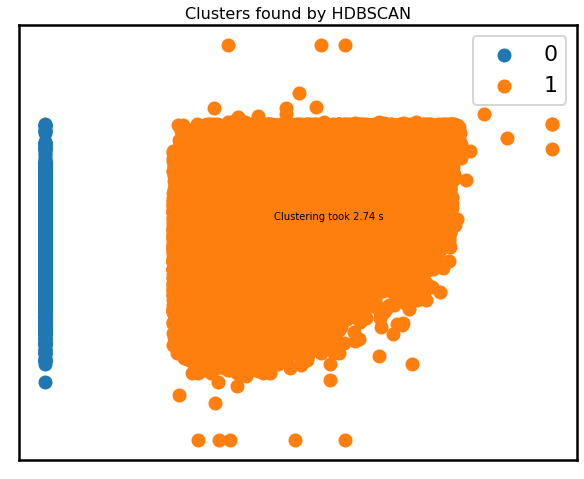

In [317]:
plot_clusters1(np.vstack(hdbdf).T, hdbscan.HDBSCAN, (), {'min_cluster_size':60, 
                                                         'metric':'euclidean',
                                                         'max_cluster_size':0,
                                                          'min_samples':10},
              )

/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Statistics=0.995, p=0.000


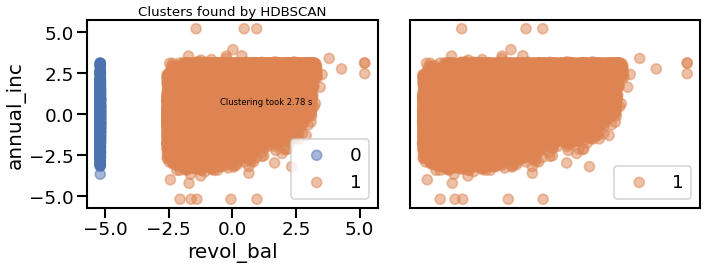

In [343]:
l, c = plot_clusters2(np.vstack(hdbdf).T, hdbscan.HDBSCAN, (), {'min_cluster_size':60, 
                                                                 'metric':'euclidean',
                                                                 'max_cluster_size':0,
                                                                  'min_samples':10},
                                                                     xlb='revol_bal',
                                                                    ylb='annual_inc')

In [329]:
l==0

array([False, False, False, ..., False, False, False])

In [335]:
np.array(c)[l==1]

array([[0.86666667, 0.51764706, 0.32156863],
       [0.86666667, 0.51764706, 0.32156863],
       [0.86666667, 0.51764706, 0.32156863],
       ...,
       [0.86666667, 0.51764706, 0.32156863],
       [0.86666667, 0.51764706, 0.32156863],
       [0.86666667, 0.51764706, 0.32156863]])

In [190]:
hdbdf = np.array([df_udsampl.query("loanStatus==0")['revol_bal'], 
            df_udsampl.query("loanStatus==0")['annual_inc']])

/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/matplotlib/collections.py:1098: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


[] []


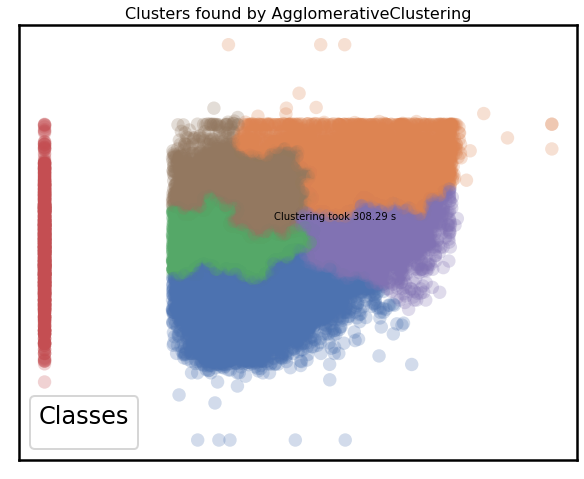

In [234]:
lbls = plot_clusters(data=np.vstack(hdbdf).T, 
              algorithm = cluster.AgglomerativeClustering,
              args=(), 
              kwds = {'n_clusters':6, 'linkage':'ward'})

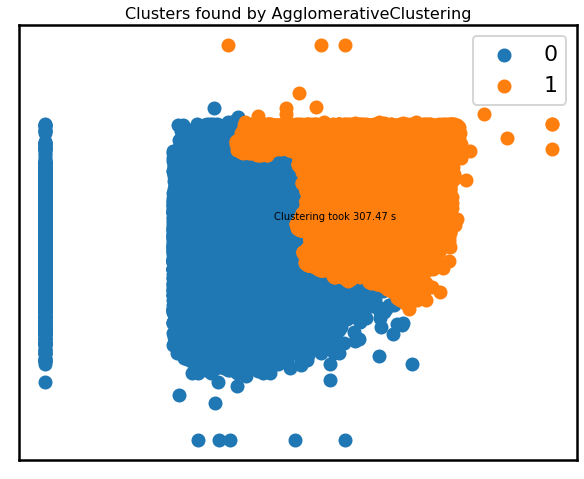

In [277]:
lbls = plot_clusters1(data=np.vstack(hdbdf).T, 
              algorithm = cluster.AgglomerativeClustering,
              args=(), 
              kwds = {'n_clusters':3, 'linkage':'ward'})

In [273]:
np.vstack(hdbdf).T[lbl==3,0], np.vstack(hdbdf).T[lbl==3,1]

(array([-5.19933758, -5.19933758, -5.19933758, -5.19933758, -5.19933758,
        -5.19933758, -5.19933758, -5.19933758, -5.19933758, -5.19933758,
        -5.19933758, -5.19933758, -5.19933758, -5.19933758, -5.19933758]),
 array([-2.65173198, -2.70615109, -2.54589526, -2.65173198, -2.65173198,
        -2.65173198, -2.65173198, -2.65173198, -2.65173198, -2.70615109,
        -2.70615109, -2.54589526, -2.54589526, -2.65173198, -2.65173198]))

In [271]:
np.vstack(hdbdf).T[lbl==3,0].shape, np.vstack(hdbdf).T[lbl==3,1].shape

((15,), (15,))

In [278]:
MyList = list(lbls)
my_dict = {i:MyList.count(i) for i in MyList}
Keymax = max(zip(my_dict.values(), my_dict.keys()))[1]
Keymax

{0: 47307, 1: 29397}

0

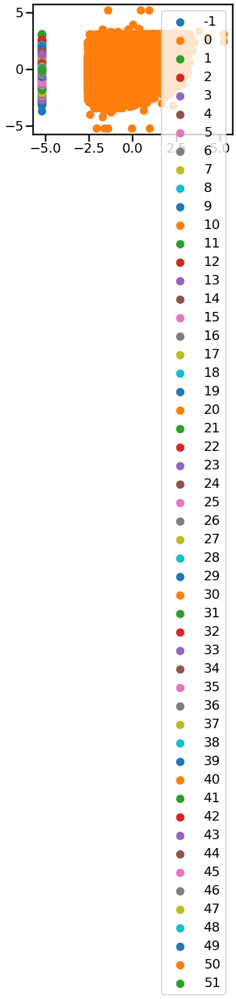

In [258]:
for c in np.unique(lbl):
#     print(c)
    plt.scatter(np.vstack(hdbdf).T[lbl==c,0],
                np.vstack(hdbdf).T[lbl==c,1], label=c) #, c=colors, **plot_kwds)
    plt.legend()

In [263]:
lbl = plot_clusters1(np.vstack(hdbdf).T, hdbscan.HDBSCAN, (), {'min_cluster_size':8})
# lbl =  plot_clusters(data=np.vstack(hdbdf).T, 
#               algorithm = hdbscan.HDBSCAN,
#               args=(), 
#               kwds = {'n_clusters':6, 'linkage':'ward'})

IndexError: boolean index did not match indexed array along dimension 0; dimension is 2 but corresponding boolean dimension is 76704

<Figure size 720x576 with 0 Axes>

In [247]:
np.unique(lbl)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,
       33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,
       50, 51])

In [233]:
np.unique(lbl)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,
       33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,
       50, 51])

In [224]:
sc.legend_elements()

/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/matplotlib/collections.py:1098: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


([], [])

In [ ]:
## 

## TRAIN, VAL \& TEST SPLIT DATA

In [73]:
xtrain, X_test, ytrain, y_test = train_test_split(X_resampled, y_resampled, test_size=0.20, random_state=SEED, shuffle=True)
X_train, X_val, y_train, y_val = train_test_split(xtrain, ytrain, test_size=0.10, shuffle=True)

In [74]:
parameters = {'criterion': ['entropy', 'gini'],
               'max_depth': list(np.linspace(10, 1200, 10, dtype = int)) + [None],
               'max_features': ['auto', 'sqrt','log2', None],
               'min_samples_leaf': [4, 12],
               'min_samples_split': [5, 10],
               'n_estimators': list(np.linspace(151, 1200, 10, dtype = int))}

In [75]:
from scipy.stats import shapiro

def shapiro_wilk(df):
    columns = df.columns
    int_columns = []
    normality_column_name = []
    normality_statistic = []
    normality_result = []
    for column_type in columns:
        if df[column_type].dtypes == "int64" or df[column_type].dtypes == "float64":
            int_columns.append(column_type)
    for column in int_columns:
        stat, p = shapiro(df[column])
        statistic = ('Statistics=%.3f, p=%.3f' % (stat, p))
        #print('Statistics=%.3f, p=%.3f' % (stat, p))
        # interpret
        alpha = 0.05
        if p > alpha:
            normality_column_name.append(column)
            normality_statistic.append(statistic)
            normality.append("Sample looks Gaussian")
                    
        else:
            normality_column_name.append(column)
            normality_statistic.append(statistic)
            normality_result.append("Sample does not look Gaussian")
        
    normality_column_name = pd.DataFrame(normality_column_name, columns =['Column Name'])
    normality_statistic = pd.DataFrame(normality_statistic, columns =['Statistic']) 
    normality_result = pd.DataFrame(normality_result, columns =['Result']) 


    result = pd.concat([normality_column_name, normality_statistic, normality_result], axis=1, sort=False)
    
    return result 

In [72]:
shapiro_wilk(df=X_train)

/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


,Column Name,Statistic,Result
0,loan_amnt,"Statistics=0.966, p=0.000",Sample does not look Gaussian
1,int_rate,"Statistics=0.958, p=0.000",Sample does not look Gaussian
2,installment,"Statistics=1.000, p=0.000",Sample does not look Gaussian
3,annual_inc,"Statistics=1.000, p=0.000",Sample does not look Gaussian
4,dti,"Statistics=0.996, p=0.000",Sample does not look Gaussian
5,open_acc,"Statistics=0.997, p=0.000",Sample does not look Gaussian
6,revol_bal,"Statistics=0.967, p=0.000",Sample does not look Gaussian
7,revol_util,"Statistics=0.959, p=0.000",Sample does not look Gaussian
8,total_acc,"Statistics=0.999, p=0.000",Sample does not look Gaussian
9,term,"Statistics=0.583, p=0.000",Sample does not look Gaussian


In [127]:
modeller = []
modelName = []

        
def dictforloop(index,accuracy,recall,f1):
    dictForPlot = []
    dictForList =[]
    
    dictForPlot.append({"Model_Name":index,"ScoreType":"accuracy","Score":accuracy})
    dictForPlot.append({"Model_Name":index,"ScoreType":"Recall_Score_0","Score":recall[0]}) 
    dictForPlot.append({"Model_Name":index,"ScoreType":"Recall_Score_1","Score":recall[1]})
    dictForPlot.append({"Model_Name":index,"ScoreType":"F1_Score_0","Score":f1[0]}) 
    dictForPlot.append({"Model_Name":index,"ScoreType":"F1_Score_1","Score":f1[1]})
    
    dictForList = {"Model_Name":index,"Accuracy":accuracy,"Recall_Score_0":recall[0],
              "Recall_Score_1":recall[1],"F1_Score_0":f1[0],"F1_Score_1":f1[1]}
    
    return dictForPlot,dictForList
def display_all(df):
    with pd.option_context("display.max_rows", 1000, "display.max_columns", 1000): 
        display(df)
        
def importance_plot(model_name, thresh_hold):
    Importance=pd.DataFrame({"Importance":model_name.feature_importances_*100},
                       index=X_train.columns)
    importance = Importance.sort_values(by="Importance",
                      axis=0,ascending=False).iloc[0:10,:]
    importance.sort_values(by="Importance",
                      axis=0,ascending=True).plot(kind="barh",color="r")
    plt.xlabel("Değişken Önem Düzeyleri")


    a = Importance.sort_values("Importance", ascending = False)
    display_all(a[a['Importance']>thresh_hold])

def conf_mtrx(y_test, y_pred, model): 

    cm = confusion_matrix(y_test,y_pred)    
    f, ax = plt.subplots(figsize =(5,5))
    cm = confusion_matrix(y_test,y_pred)
    sns.heatmap(cm,annot = True, linewidths=0.5, linecolor="red",fmt = ".0f",ax=ax)#,cmap=plt.cm.RdPu
    plt.xlabel("predicted y values")
    plt.ylabel("real y values")
    plt.title("\nConfusion Matrix")
    plt.show()
    
def rc_recis_scres(y_test, y_pred, algorithm_name):
    from sklearn.metrics import recall_score,precision_score,accuracy_score, f1_score

    rs=recall_score(y_test, y_pred) 
    ps=precision_score(y_test, y_pred)
    f1=f1_score(y_test, y_pred)

    print()    

def roc_auc_curve_plot(model_name, X_testt, y_testt):
    ns_probs = [0 for _ in range(len(y_testt))]
    # fit a model
    # predict probabilities
    model_probs = model_name.predict_proba(X_testt)
    # keep probabilities for the positive outcome only
    model_probs = model_probs[:, 1]
    # calculate scores
    ns_auc = roc_auc_score(y_testt, ns_probs)
    lr_auc = roc_auc_score(y_testt, model_probs)
    # summarize scores
    print('No Skill: ROC AUC=%.3f' % (ns_auc))
    print( ': ROC AUC=%.3f' % (lr_auc))
    # calculate roc curves
    ns_fpr, ns_tpr, _ = roc_curve(y_testt, ns_probs)
    model_fpr, model_tpr, _ = roc_curve(y_testt, model_probs)
    # plot the roc curve for the model
    pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
    pyplot.plot(model_fpr, model_tpr, marker='.', label='Logistic')
    # axis labels
    pyplot.xlabel('False Positive Rate')
    pyplot.ylabel('True Positive Rate')
    # show the legend
    pyplot.legend()
    # show the plot
    pyplot.show() 
    
def plot_roc_curve(fpr, tpr):
    plt.figure(figsize=(5,5))
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr,tpr, label = roc_auc_score) 
    plt.plot([0,1],ls='--')
    plt.plot([0,0],[1,0],c='.5')
    plt.plot([1,1],c='.5')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()   
    
def ML_Algorithms(model,alg_name, x_trainn,x_testt, y_trainn, y_testt):
    from sklearn.metrics import roc_auc_score,roc_curve
    
    modell = model()
    result_model = modell.fit(x_trainn, y_trainn)
    y_pred = result_model.predict(x_testt)    
    conf_mtrx(y_testt, y_pred, model)
    print("*****",alg_name," ALGORITHM:") 
    rc_recis_scres(y_testt, y_pred, alg_name)  
    
    
    modeller.append(result_model)
    modelName.append(alg_name)
    
    print("classification_report\n",classification_report(y_testt, y_pred))
    print("Accuracy Score for ", alg_name ,accuracy_score(y_testt, y_pred))
    
    tn, fp, fn, tp = confusion_matrix([0, 1, 0, 1], [1, 1, 1, 0]).ravel()
    y_probs = modell.predict_proba(x_testt)[:,1] # This will give you positive class prediction probabilities  
    y_pred = np.where(y_probs > 0.5, 1, 0) # This will threshold the probabilities to give class predictions.
    print("TAN")

    fpr, tpr, thresholds = roc_curve(y_testt, y_probs)
#     fpr, tpr, _ = roc_curve(y_test, predicted_probab)

#     plt.plot(fpr, tpr, marker='.', label = alg_name)
#     plt.xlabel('False Positive Rate')
#     plt.ylabel('True Positive Rate')
#     plt.legend()

    probs = modell.predict_proba(x_testt)
    probs = probs[:, 1]
    
    print()
    auc = roc_auc_score(y_testt, probs)
    print('AUC: %.2f' % auc)
    #plot_roc_curve(fpr, tpr)
    idx = find_nearest(array=tpr, value=auc)
    print('max coord', (fpr[idx], tpr[idx]))
    
    plt.figure(figsize=(10,6), dpi=80)
    plt.plot(fpr, tpr, marker='.', label = alg_name)
    plt.plot(fpr[idx], tpr[idx], 'r', marker='*', markersize=15, label='AUC: %.2f' % auc)
    plt.plot([0,1],ls='--', label='breakeven')
    plt.plot([0,0],[1,0],c='.5', label='Perfect')
    plt.plot([1,1],c='.5')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    
    return model 

In [128]:
def find_nearest(array, value):
    
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    
    return idx #array[idx]

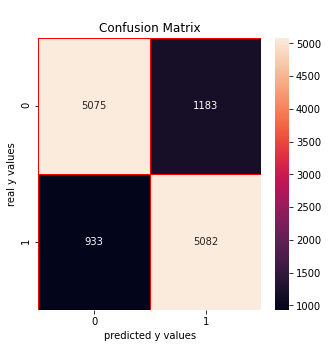

***** Random Forest Classifier  ALGORITHM:

classification_report
               precision    recall  f1-score   support

         0.0       0.84      0.81      0.83      6258
         1.0       0.81      0.84      0.83      6015

    accuracy                           0.83     12273
   macro avg       0.83      0.83      0.83     12273
weighted avg       0.83      0.83      0.83     12273

Accuracy Score for  Random Forest Classifier 0.8275890165403732
TAN

AUC: 0.92
max coord (0.30808565036752955, 0.9168744804655029)


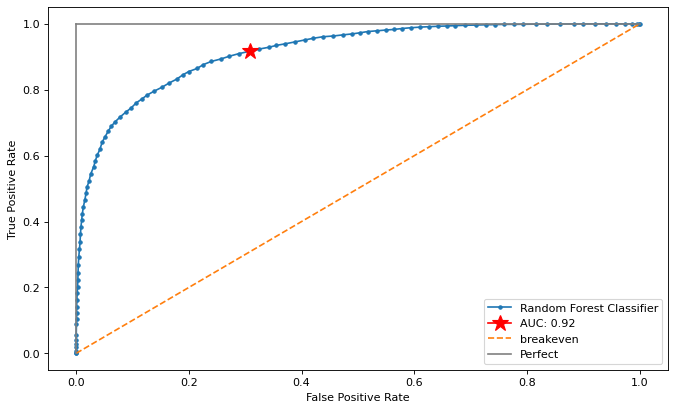

In [129]:
md = ML_Algorithms(RandomForestClassifier, "Random Forest Classifier", X_train, X_val, y_train, y_val)

In [122]:
# CatBoostClassifier.

In [143]:
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegressionCV
from sklearn.ensemble import AdaBoostClassifier


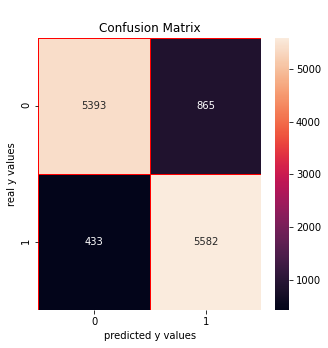

***** lightgbm  ALGORITHM:

classification_report
               precision    recall  f1-score   support

         0.0       0.93      0.86      0.89      6258
         1.0       0.87      0.93      0.90      6015

    accuracy                           0.89     12273
   macro avg       0.90      0.89      0.89     12273
weighted avg       0.90      0.89      0.89     12273

Accuracy Score for  lightgbm 0.8942393872728754
TAN

AUC: 0.96
max coord (0.18520294023649728, 0.9649210307564422)


lightgbm.sklearn.LGBMClassifier

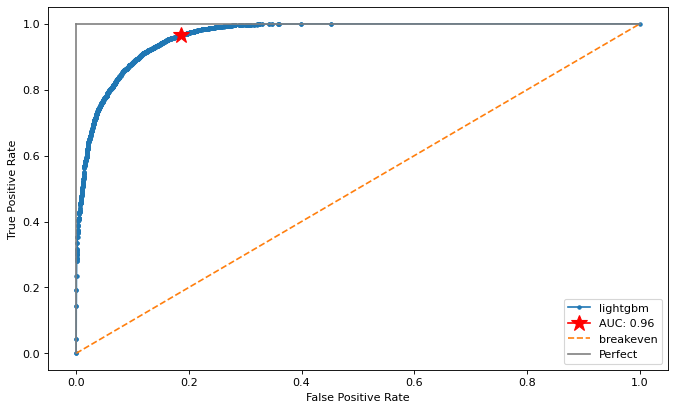

In [146]:
ML_Algorithms(LGBMClassifier, "lightgbm", X_train, X_val, y_train, y_val)

Learning rate set to 0.076802
0:	learn: 0.6806801	total: 10.6ms	remaining: 10.6s
1:	learn: 0.6669228	total: 19.3ms	remaining: 9.63s
2:	learn: 0.6602480	total: 26.9ms	remaining: 8.95s
3:	learn: 0.6523996	total: 42.9ms	remaining: 10.7s
4:	learn: 0.6474834	total: 50.4ms	remaining: 10s
5:	learn: 0.6433788	total: 57.9ms	remaining: 9.6s
6:	learn: 0.6393112	total: 65.6ms	remaining: 9.31s
7:	learn: 0.6338098	total: 73.2ms	remaining: 9.08s
8:	learn: 0.6291661	total: 80.6ms	remaining: 8.87s
9:	learn: 0.6240297	total: 87.8ms	remaining: 8.69s
10:	learn: 0.6207069	total: 95ms	remaining: 8.54s
11:	learn: 0.6186168	total: 103ms	remaining: 8.45s
12:	learn: 0.6168845	total: 110ms	remaining: 8.35s
13:	learn: 0.6152327	total: 117ms	remaining: 8.27s
14:	learn: 0.6042154	total: 125ms	remaining: 8.19s
15:	learn: 0.6029326	total: 132ms	remaining: 8.13s
16:	learn: 0.6019092	total: 140ms	remaining: 8.07s
17:	learn: 0.5927017	total: 147ms	remaining: 8.02s
18:	learn: 0.5819479	total: 154ms	remaining: 7.96s
19:	l

178:	learn: 0.2802063	total: 1.39s	remaining: 6.39s
179:	learn: 0.2800257	total: 1.4s	remaining: 6.38s
180:	learn: 0.2798401	total: 1.41s	remaining: 6.37s
181:	learn: 0.2796147	total: 1.42s	remaining: 6.36s
182:	learn: 0.2793679	total: 1.42s	remaining: 6.35s
183:	learn: 0.2792525	total: 1.43s	remaining: 6.34s
184:	learn: 0.2789897	total: 1.44s	remaining: 6.33s
185:	learn: 0.2787710	total: 1.45s	remaining: 6.32s
186:	learn: 0.2785410	total: 1.45s	remaining: 6.32s
187:	learn: 0.2777791	total: 1.46s	remaining: 6.31s
188:	learn: 0.2765452	total: 1.47s	remaining: 6.3s
189:	learn: 0.2763553	total: 1.48s	remaining: 6.29s
190:	learn: 0.2761330	total: 1.48s	remaining: 6.28s
191:	learn: 0.2747459	total: 1.49s	remaining: 6.27s
192:	learn: 0.2745614	total: 1.5s	remaining: 6.26s
193:	learn: 0.2740197	total: 1.5s	remaining: 6.25s
194:	learn: 0.2738237	total: 1.51s	remaining: 6.24s
195:	learn: 0.2736395	total: 1.52s	remaining: 6.23s
196:	learn: 0.2717123	total: 1.53s	remaining: 6.22s
197:	learn: 0.27

338:	learn: 0.2324245	total: 2.59s	remaining: 5.05s
339:	learn: 0.2323426	total: 2.6s	remaining: 5.04s
340:	learn: 0.2322377	total: 2.6s	remaining: 5.04s
341:	learn: 0.2318994	total: 2.61s	remaining: 5.03s
342:	learn: 0.2316665	total: 2.62s	remaining: 5.02s
343:	learn: 0.2315699	total: 2.63s	remaining: 5.01s
344:	learn: 0.2314905	total: 2.63s	remaining: 5s
345:	learn: 0.2314151	total: 2.64s	remaining: 4.99s
346:	learn: 0.2313394	total: 2.65s	remaining: 4.99s
347:	learn: 0.2310894	total: 2.66s	remaining: 4.98s
348:	learn: 0.2309846	total: 2.67s	remaining: 4.97s
349:	learn: 0.2308835	total: 2.67s	remaining: 4.96s
350:	learn: 0.2308096	total: 2.68s	remaining: 4.96s
351:	learn: 0.2307231	total: 2.69s	remaining: 4.95s
352:	learn: 0.2301812	total: 2.69s	remaining: 4.94s
353:	learn: 0.2300811	total: 2.7s	remaining: 4.93s
354:	learn: 0.2299783	total: 2.71s	remaining: 4.92s
355:	learn: 0.2290234	total: 2.72s	remaining: 4.92s
356:	learn: 0.2289319	total: 2.73s	remaining: 4.91s
357:	learn: 0.2288

522:	learn: 0.2039824	total: 3.98s	remaining: 3.63s
523:	learn: 0.2039239	total: 3.99s	remaining: 3.63s
524:	learn: 0.2038390	total: 4s	remaining: 3.62s
525:	learn: 0.2037689	total: 4.01s	remaining: 3.61s
526:	learn: 0.2037091	total: 4.01s	remaining: 3.6s
527:	learn: 0.2036224	total: 4.02s	remaining: 3.6s
528:	learn: 0.2035515	total: 4.03s	remaining: 3.59s
529:	learn: 0.2034945	total: 4.04s	remaining: 3.58s
530:	learn: 0.2034211	total: 4.04s	remaining: 3.57s
531:	learn: 0.2033711	total: 4.05s	remaining: 3.56s
532:	learn: 0.2033323	total: 4.06s	remaining: 3.56s
533:	learn: 0.2032585	total: 4.07s	remaining: 3.55s
534:	learn: 0.2031957	total: 4.07s	remaining: 3.54s
535:	learn: 0.2031495	total: 4.08s	remaining: 3.53s
536:	learn: 0.2030999	total: 4.09s	remaining: 3.52s
537:	learn: 0.2030280	total: 4.1s	remaining: 3.52s
538:	learn: 0.2028578	total: 4.1s	remaining: 3.51s
539:	learn: 0.2025700	total: 4.11s	remaining: 3.5s
540:	learn: 0.2023356	total: 4.12s	remaining: 3.49s
541:	learn: 0.202282

681:	learn: 0.1855102	total: 5.18s	remaining: 2.42s
682:	learn: 0.1854626	total: 5.19s	remaining: 2.41s
683:	learn: 0.1854149	total: 5.2s	remaining: 2.4s
684:	learn: 0.1849324	total: 5.21s	remaining: 2.4s
685:	learn: 0.1848738	total: 5.22s	remaining: 2.39s
686:	learn: 0.1848156	total: 5.23s	remaining: 2.38s
687:	learn: 0.1847670	total: 5.24s	remaining: 2.37s
688:	learn: 0.1847041	total: 5.24s	remaining: 2.37s
689:	learn: 0.1846521	total: 5.25s	remaining: 2.36s
690:	learn: 0.1845461	total: 5.26s	remaining: 2.35s
691:	learn: 0.1845077	total: 5.27s	remaining: 2.34s
692:	learn: 0.1844622	total: 5.27s	remaining: 2.34s
693:	learn: 0.1844165	total: 5.28s	remaining: 2.33s
694:	learn: 0.1843891	total: 5.29s	remaining: 2.32s
695:	learn: 0.1843268	total: 5.3s	remaining: 2.31s
696:	learn: 0.1842671	total: 5.31s	remaining: 2.31s
697:	learn: 0.1842171	total: 5.31s	remaining: 2.3s
698:	learn: 0.1841679	total: 5.32s	remaining: 2.29s
699:	learn: 0.1841228	total: 5.33s	remaining: 2.28s
700:	learn: 0.184

864:	learn: 0.1730892	total: 6.6s	remaining: 1.03s
865:	learn: 0.1729143	total: 6.61s	remaining: 1.02s
866:	learn: 0.1728797	total: 6.62s	remaining: 1.01s
867:	learn: 0.1728258	total: 6.63s	remaining: 1.01s
868:	learn: 0.1727792	total: 6.63s	remaining: 1000ms
869:	learn: 0.1727392	total: 6.64s	remaining: 992ms
870:	learn: 0.1726627	total: 6.65s	remaining: 985ms
871:	learn: 0.1726151	total: 6.66s	remaining: 977ms
872:	learn: 0.1725672	total: 6.67s	remaining: 970ms
873:	learn: 0.1725157	total: 6.67s	remaining: 962ms
874:	learn: 0.1724629	total: 6.68s	remaining: 954ms
875:	learn: 0.1724297	total: 6.69s	remaining: 947ms
876:	learn: 0.1723865	total: 6.7s	remaining: 939ms
877:	learn: 0.1723525	total: 6.7s	remaining: 932ms
878:	learn: 0.1723167	total: 6.71s	remaining: 924ms
879:	learn: 0.1722653	total: 6.72s	remaining: 916ms
880:	learn: 0.1722154	total: 6.73s	remaining: 909ms
881:	learn: 0.1721729	total: 6.74s	remaining: 901ms
882:	learn: 0.1721318	total: 6.74s	remaining: 894ms
883:	learn: 0.

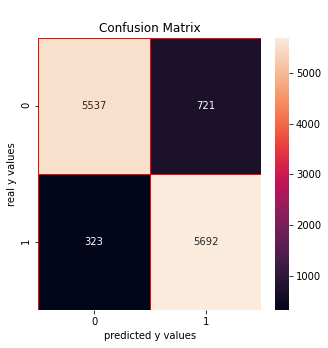

***** CatBoost  ALGORITHM:

classification_report
               precision    recall  f1-score   support

         0.0       0.94      0.88      0.91      6258
         1.0       0.89      0.95      0.92      6015

    accuracy                           0.91     12273
   macro avg       0.92      0.92      0.91     12273
weighted avg       0.92      0.91      0.91     12273

Accuracy Score for  CatBoost 0.9149352236616964
TAN

AUC: 0.98
max coord (0.17609459891339085, 0.9787198669991688)


catboost.core.CatBoostClassifier

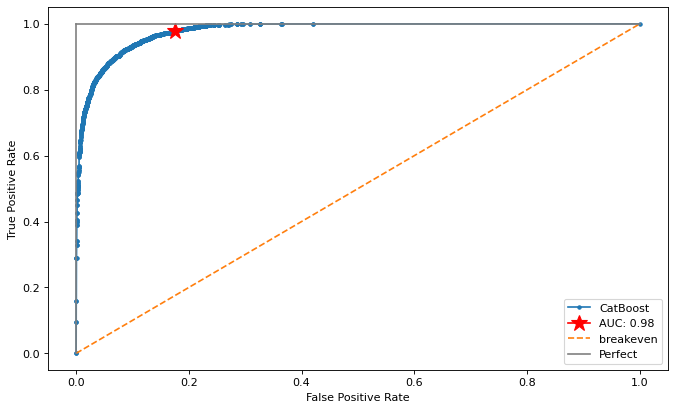

In [145]:
ML_Algorithms(CatBoostClassifier, "CatBoost", X_train, X_val, y_train, y_val)

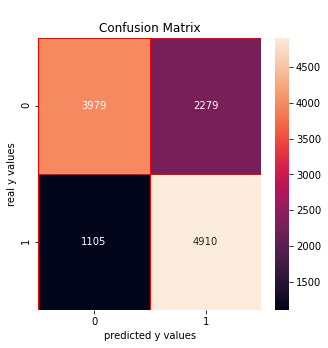

***** AdaBoost  ALGORITHM:

classification_report
               precision    recall  f1-score   support

         0.0       0.78      0.64      0.70      6258
         1.0       0.68      0.82      0.74      6015

    accuracy                           0.72     12273
   macro avg       0.73      0.73      0.72     12273
weighted avg       0.73      0.72      0.72     12273

Accuracy Score for  AdaBoost 0.7242727939379124
TAN

AUC: 0.80
max coord (0.34164269734739533, 0.799833748960931)


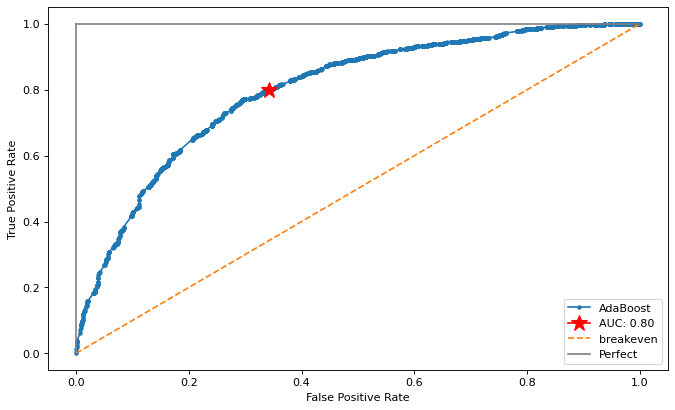

In [144]:
md = ML_Algorithms(AdaBoostClassifier, "AdaBoost", X_train, X_val, y_train, y_val)

# LR

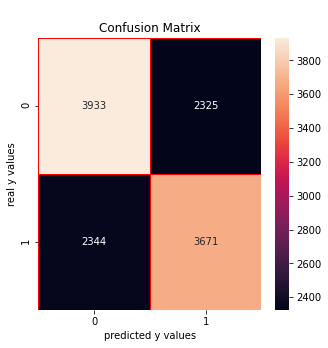

***** LogisticRegression  ALGORITHM:

classification_report
               precision    recall  f1-score   support

         0.0       0.63      0.63      0.63      6258
         1.0       0.61      0.61      0.61      6015

    accuracy                           0.62     12273
   macro avg       0.62      0.62      0.62     12273
weighted avg       0.62      0.62      0.62     12273

Accuracy Score for  LogisticRegression 0.6195714169314755
TAN

AUC: 0.67
max coord (0.4274528603387664, 0.6698254364089775)


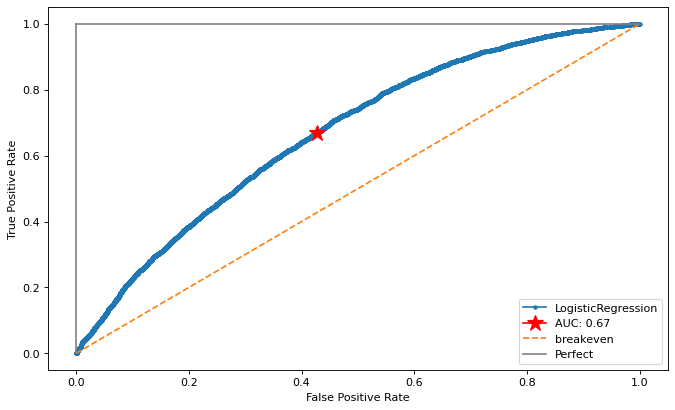

In [142]:
md = ML_Algorithms(LogisticRegressionCV, "LogisticRegression", X_train, X_val, y_train, y_val)

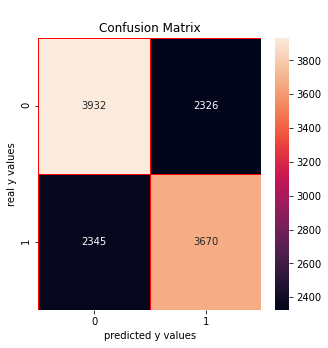

***** Logistic Regression  ALGORITHM:

classification_report
               precision    recall  f1-score   support

         0.0       0.63      0.63      0.63      6258
         1.0       0.61      0.61      0.61      6015

    accuracy                           0.62     12273
   macro avg       0.62      0.62      0.62     12273
weighted avg       0.62      0.62      0.62     12273

Accuracy Score for  Logistic Regression 0.6194084575898313
TAN

AUC: 0.67
max coord (0.42665388302972196, 0.6696591853699085)


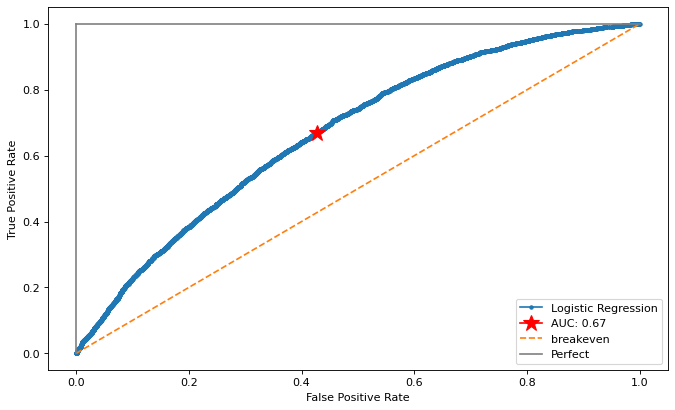

In [132]:
md = ML_Algorithms(LogisticRegression, "Logistic Regression", X_train, X_val, y_train, y_val)

# KNN

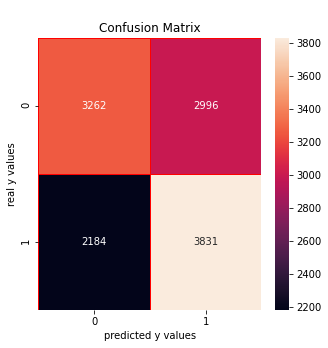

***** KNN  ALGORITHM:

classification_report
               precision    recall  f1-score   support

         0.0       0.60      0.52      0.56      6258
         1.0       0.56      0.64      0.60      6015

    accuracy                           0.58     12273
   macro avg       0.58      0.58      0.58     12273
weighted avg       0.58      0.58      0.58     12273

Accuracy Score for  KNN 0.5779353051413673
TAN

AUC: 0.60
max coord (0.47874720357941836, 0.6369077306733167)


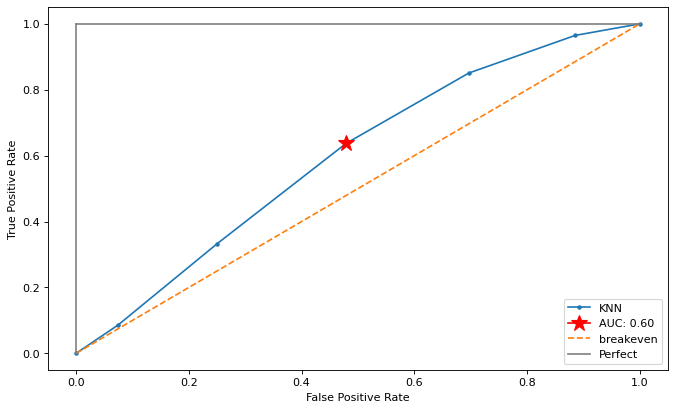

In [137]:
md = ML_Algorithms(KNeighborsClassifier, "KNN", X_train, X_val, y_train, y_val)

# GNB

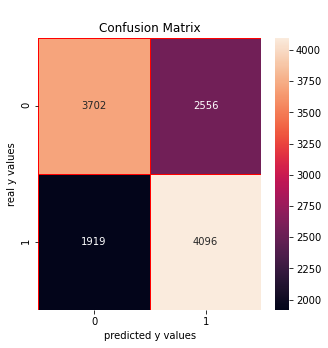

***** Gaussian Bayes  ALGORITHM:

classification_report
               precision    recall  f1-score   support

         0.0       0.66      0.59      0.62      6258
         1.0       0.62      0.68      0.65      6015

    accuracy                           0.64     12273
   macro avg       0.64      0.64      0.64     12273
weighted avg       0.64      0.64      0.63     12273

Accuracy Score for  Gaussian Bayes 0.6353784730709688
TAN

AUC: 0.68
max coord (0.4098753595397891, 0.6839567747298421)


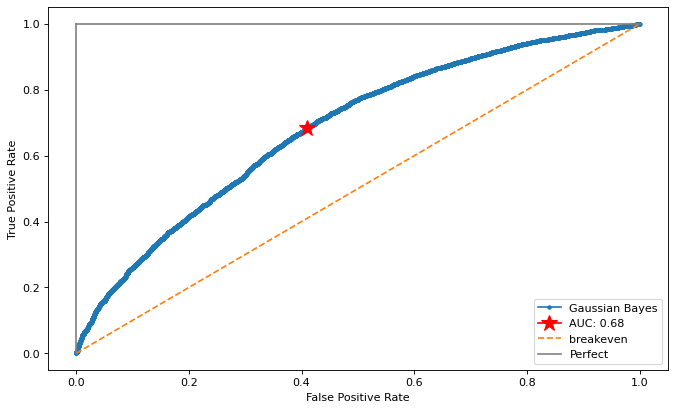

In [135]:

md = ML_Algorithms(GaussianNB, "Gaussian Bayes", X_train, X_val, y_train, y_val)

# RF

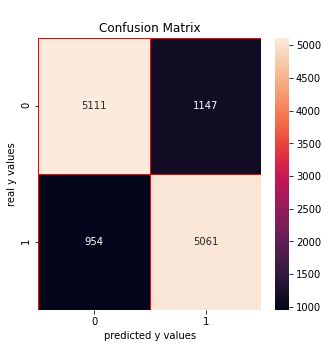

***** Random Forest Classifier  ALGORITHM:

classification_report
               precision    recall  f1-score   support

         0.0       0.84      0.82      0.83      6258
         1.0       0.82      0.84      0.83      6015

    accuracy                           0.83     12273
   macro avg       0.83      0.83      0.83     12273
weighted avg       0.83      0.83      0.83     12273

Accuracy Score for  Random Forest Classifier 0.8288112116027051
TAN

AUC: 0.91
max coord (0.3055289229785874, 0.9115544472152951)


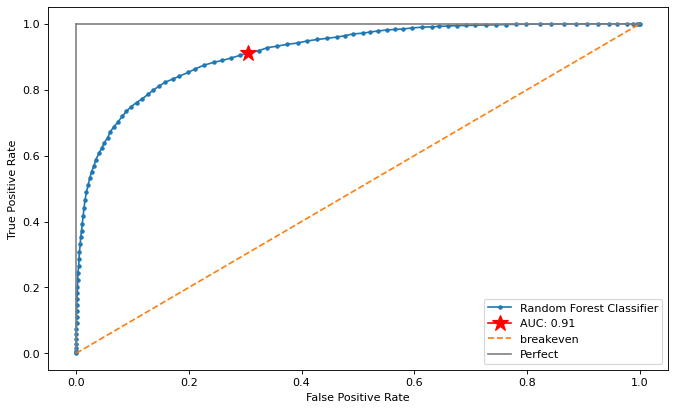

In [133]:
md = ML_Algorithms(RandomForestClassifier, "Random Forest Classifier", X_train, X_val, y_train, y_val)

In [ ]:
# GA

In [ ]:
# ! pip install tpot==0.12.0

In [154]:
%load_ext autoreload
%autoreload 2
from tpot import TPOTClassifier
from deap.gp import Primitive
from sklearn.ensemble import RandomForestClassifier
import time, os

tpot_classifier = TPOTClassifier(generations= 50,
                                 population_size= 24,
                                 offspring_size= 12,
                                 verbosity= 2,
                                 early_stop= 12,
                                 config_dict={'sklearn.ensemble.RandomForestClassifier': parameters}, 
                                 cv = 5, 
                                 scoring = 'accuracy',
                                n_jobs=os.cpu_count()-10,
                                log_file='galog.log')
start_time = time.time()
print("Commenced Time:", time.strftime("%H:%M:%S", time.gmtime(start_time)))

tpot_classifier.fit(X_train,y_train)

stop_time = time.time()
print("End Time:", time.strftime("%H:%M:%S", time.gmtime(stop_time)))
#     scores = cross_val_score(optimal_model, X, y, cv=skf, scoring="accuracy")

print("Elapsed Time:", time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Commenced Time: 01:10:17


Version 0.12.0 of tpot is outdated. Version 0.12.1 was released Tuesday August 15, 2023.


Optimization Progress:   0%|          | 0/624 [00:00<?, ?pipeline/s]

/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or r

/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or r

/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or r

RuntimeError: There was an error in the TPOT optimization process. This could be because the data was not formatted properly, or because data for a regression problem was provided to the TPOTClassifier object. Please make sure you passed the data to TPOT correctly. If you enabled PyTorch estimators, please check the data requirements in the online documentation: https://epistasislab.github.io/tpot/using/

In [ ]:
X_train

In [ ]:
import multiprocessing, os

print(multiprocessing.cpu_count())
print(os.cpu_count())

In [ ]:
tpot_classifier?